In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from IPython.display import display, HTML
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
import plotly.figure_factory as ff
import plotly.graph_objects as go
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')
import nltk

import logging

plt.style.use('dark_background')

import warnings
warnings.filterwarnings('ignore')
train = pd.read_csv('/kaggle/input/playground-series-s5e6/train.csv').set_index('id')
test = pd.read_csv('/kaggle/input/playground-series-s5e6/test.csv').set_index("id")
orig_data = pd.read_csv("/kaggle/input/fertilizer-prediction/Fertilizer Prediction.csv")
train.head()
train = pd.concat([train, orig_data], ignore_index=True)

# Explore data structure
print("Dataset shape:", train.shape)
print("\nColumn names:")
print(train.columns.tolist())
print("\nData types:")
print(train.dtypes)
print("\nFirst few rows:")
print(train.head())

Dataset shape: (850000, 9)

Column names:
['Temparature', 'Humidity', 'Moisture', 'Soil Type', 'Crop Type', 'Nitrogen', 'Potassium', 'Phosphorous', 'Fertilizer Name']

Data types:
Temparature         int64
Humidity            int64
Moisture            int64
Soil Type          object
Crop Type          object
Nitrogen            int64
Potassium           int64
Phosphorous         int64
Fertilizer Name    object
dtype: object

First few rows:
   Temparature  Humidity  Moisture Soil Type  Crop Type  Nitrogen  Potassium  \
0           37        70        36    Clayey  Sugarcane        36          4   
1           27        69        65     Sandy    Millets        30          6   
2           29        63        32     Sandy    Millets        24         12   
3           35        62        54     Sandy     Barley        39         12   
4           35        58        43       Red      Paddy        37          2   

   Phosphorous Fertilizer Name  
0            5           28-28  
1       

In [15]:
Target_Col = ['Fertilizer Name']
Identifier_Cols = []
X_Cols = ['Temparature', 'Humidity', 'Moisture', 'Soil Type', 'Crop Type', 'Nitrogen', 'Potassium', 'Phosphorous']

* Basic Utilities

In [14]:
def intersection_of_lists(list1, list2):
    return list(set(list1) & set(list2))


def difference_of_lists(list1, list2):
    return [item for item in list1 if item not in list2]


def remove_single_unique_or_all_nans(df):
    removed_columns = []
    for column in df.columns:
        if df[column].nunique() <= 1 or df[column].isna().all():
            removed_columns.append(column)
            df = df.drop(columns=[column])
    print(f"Removed columns due to all NaN or only 1 unique value: {removed_columns}")
    return df


def columns_with_missing_values(df):
    missing_cols = [col for col in df.columns if df[col].isna().values.any()]
    print(f"Missing data columns: {missing_cols}")
    return missing_cols


def columns_with_more_than_X_percent_unique(df, colNames, perc):
    total_rows = len(df)
    threshold = total_rows * 0.01 * perc  
    cols_with_high_uniques = [col for col in colNames if df[col].nunique() > threshold]
    print(f"Columns with high uniques , >= {perc} %  of number of rows in the data: {cols_with_high_uniques}")
    return cols_with_high_uniques


def get_numeric_and_non_numeric_columns(df):
        numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
        non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
        print(f"Numeric columns: {numeric_cols}")
        print(f"Non-numeric columns: {non_numeric_cols}")
        return numeric_cols, non_numeric_cols

In [16]:
data = train.copy()
Numeric_Cols, Non_Numeric_Cols = get_numeric_and_non_numeric_columns(data[X_Cols])
MissingData_Cols = columns_with_missing_values(data[X_Cols])
GreaterThanTENpercUniQ_Cols = columns_with_more_than_X_percent_unique(data, Numeric_Cols, 75)
GreaterThanEIGHTpercUniQ_Cols = columns_with_more_than_X_percent_unique(data, Numeric_Cols, 50)
GreaterThanFIVEpercUniQ_Cols = columns_with_more_than_X_percent_unique(data, Numeric_Cols, 25)
GreaterThanONEpercUniQ_Cols = columns_with_more_than_X_percent_unique(data, Numeric_Cols, 1)
LessUniqueNA_Cols = intersection_of_lists(MissingData_Cols, difference_of_lists(GreaterThanONEpercUniQ_Cols, GreaterThanFIVEpercUniQ_Cols))

Numeric columns: ['Temparature', 'Humidity', 'Moisture', 'Nitrogen', 'Potassium', 'Phosphorous']
Non-numeric columns: ['Soil Type', 'Crop Type']
Missing data columns: []
Columns with high uniques , >= 75 %  of number of rows in the data: []
Columns with high uniques , >= 50 %  of number of rows in the data: []
Columns with high uniques , >= 25 %  of number of rows in the data: []
Columns with high uniques , >= 1 %  of number of rows in the data: []


# 0. General EDA and Basic Info

In [82]:
def plot_numeric_features(df, numerical_features, apply_box_cox=False):
    """
    Function to plot density plots for features with absolute skewness > 10, histograms otherwise,
    and box plots for all numerical features. Applies Box-Cox transformation if specified.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numerical_features (list): List of numeric column names.
    - apply_box_cox (bool): If True, applies Box-Cox transformation to features with high skewness.
    """
    for feature in numerical_features:
        # Drop rows with missing values for the current feature
        valid_data = df[feature].dropna()

        if valid_data.empty:
            print(f"No valid data available for feature: {feature}")
            continue
        
        # Calculate skewness
        skewness = valid_data.skew()

        plt.figure(figsize=(12, 6))

        # Conditional plotting based on skewness
        if abs(skewness) > 10:
            if apply_box_cox:
                # Apply Box-Cox transformation (only for positive values)
                valid_data = valid_data[valid_data > 0]  # Box-Cox requires positive values
                if valid_data.empty:
                    print(f"No valid positive data available for Box-Cox transformation for {feature}")
                    continue
                transformed_data, _ = boxcox(valid_data)
                plt.subplot(1, 2, 1)
                sns.kdeplot(transformed_data, fill=True)
                plt.title(f"Density Plot of {feature} (Box-Cox Transformed)")
                plt.xlabel(f"{feature} (Box-Cox Transformed)")
                plt.ylabel("Density")
            else:
                # Density plot for features with high skewness (without transformation)
                plt.subplot(1, 2, 1)
                sns.kdeplot(valid_data, fill=True)
                plt.title(f"Density Plot of {feature} (Skewness: {skewness:.2f})")
                plt.xlabel(feature)
                plt.ylabel("Density")
        else:
            # Histogram for features with lower skewness
            plt.subplot(1, 2, 1)
            sns.histplot(valid_data, kde=True, bins=30)
            plt.title(f"Histogram of {feature} (Skewness: {skewness:.2f})")
            plt.xlabel(feature)
            plt.ylabel("Frequency")

        # Box plot for all features
        plt.subplot(1, 2, 2)
        sns.boxplot(x=valid_data)
        plt.title(f"Box Plot of {feature}")
        
        plt.tight_layout()
        plt.show()

        # Print additional statistics
        print(f"\nStatistics for {feature}:")
        print(f"Skewness: {skewness:.2f}")
        print(f"Number of Missing Values: {df[feature].isnull().sum()}")


def plot_categorical_features(df, categorical_features):
    """
    Function to plot pie charts for categorical features with fewer than 10 unique values,
    or bar graphs otherwise.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - categorical_features (list): List of categorical column names.
    """
    for feature in categorical_features:
        # Drop rows with missing values for the current feature
        valid_data = df[feature].dropna()
        
        if valid_data.empty:
            print(f"No valid data available for feature: {feature}")
            continue
        
        # Calculate value counts
        value_counts = valid_data.value_counts()
        
        # Decide chart type based on the number of unique values
        if value_counts.size < 11:
            # Pie chart for features with fewer than 11 unique values
            percentages = (value_counts / value_counts.sum()) * 100
            plt.figure(figsize=(8, 8))
            plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
            plt.title(f"Distribution of {feature} (Pie Chart)")
            plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
        else:
            # Bar graph for features with 11 or more unique values
            plt.figure(figsize=(10, 6))
            plt.bar(value_counts.index, value_counts.values, color=plt.cm.Paired.colors[:len(value_counts)])
            plt.title(f"Distribution of {feature} (Bar Graph)")
            plt.xlabel(feature)
            plt.ylabel("Count")
            plt.xticks(rotation=45)
        
        plt.tight_layout()
        plt.show()

        # Print additional statistics
        print(f"Statistics for {feature}:")
        print(f"Number of Unique Values: {df[feature].nunique()}")
        print(f"Missing Values in {feature}: {df[feature].isnull().sum()}")


def plot_correlation_heatmap(df, numerical_features, corr_type="spearman"):
    """
    Function to plot a correlation heatmap for numerical features using specified correlation type.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numerical_features (list): List of numeric column names.
    - corr_type (str): Type of correlation ('spearman', 'pearson', 'kendall', 'mic', 'pps').
    """
    # Filter valid numerical columns
    valid_data = df[numerical_features].dropna()
    
    if corr_type == "spearman":
        correlation_matrix = valid_data.corr(method="spearman")
    elif corr_type == "pearson":
        correlation_matrix = valid_data.corr(method="pearson")
    elif corr_type == "kendall":
        correlation_matrix = valid_data.corr(method="kendall")
    else:
        raise ValueError(f"Unsupported correlation type: {corr_type}. Use 'spearman', 'pearson', 'kendall'.")
    
    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(f"Correlation Matrix of Numerical Features ({corr_type.title()} Correlation)")
    plt.show()


def plot_categorical_boxplots(df, categorical_features, label_col):
    """
    Function to plot box plots for categorical features against a label column.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - categorical_features (list): List of categorical column names.
    - label_col (str): Name of the label column for the y-axis.
    """
    for feature in categorical_features:
        # Skip high-cardinality features
        if feature not in ["Podcast_Name", "Episode_Title"]:
            plt.figure(figsize=(10, 6))
            sns.boxplot(x=df[feature], y=df[label_col])
            plt.title(f"{feature} vs. {label_col}")
            plt.xlabel(feature)
            plt.ylabel(label_col)
            plt.xticks(rotation=45)
            plt.tight_layout()  # Ensure plots fit within the figure area
            plt.show()


def plot_numeric_analysis_with_sampling(df, numeric_cols, label_col, sample=0.1):
    """
    Function to compute MIC and PPS scores and plot univariate relationships between numeric columns
    and a label column, using sampled data for faster processing.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numeric_cols (list): List of numeric column names.
    - label_col (str): Name of the label column (y-variable).
    - sample (float): Fraction of valid data to sample (between 0 and 1).
    """
    logging.info("Starting numeric analysis function.")
    mine = MINE()

    for numeric_col in numeric_cols:
        logging.info(f"Processing column: {numeric_col}")
        
        # Filter rows with non-missing values for both the numeric column and the label column
        valid_data = df[[numeric_col, label_col]].dropna()

        if valid_data.empty:
            logging.warning(f"No valid data available for {numeric_col} vs. {label_col}. Skipping...")
            continue

        logging.info(f"Valid data fetched for {numeric_col} vs. {label_col}. Rows: {len(valid_data)}")
        
        # Sample the data if the fraction is specified
        if 0 < sample < 1:
            valid_data = valid_data.sample(frac=sample, random_state=42)
            logging.info(f"Data sampled. Using {len(valid_data)} rows for analysis.")

        # MIC calculation
        logging.info(f"Calculating MIC for {numeric_col} vs. {label_col}.")
        mine.compute_score(valid_data[numeric_col].values, valid_data[label_col].values)
        mic_score = mine.mic()
        logging.info(f"MIC calculated: {mic_score:.2f}")

        # PPS calculation
        logging.info(f"Calculating PPS for {numeric_col} vs. {label_col}.")
        pps_score = pps.score(valid_data, x=numeric_col, y=label_col).get("ppscore", 0)
        logging.info(f"PPS calculated: {pps_score:.2f}")

        # Plot univariate relationship
        logging.info(f"Generating scatter plot for {numeric_col} vs. {label_col}.")
        plt.figure(figsize=(10, 6))
        plt.scatter(valid_data[numeric_col], valid_data[label_col], alpha=0.6, color="blue")
        plt.title(f"{numeric_col} vs. {label_col} (MIC: {mic_score:.2f}, PPS: {pps_score:.2f})")
        plt.xlabel(numeric_col)
        plt.ylabel(label_col)
        plt.grid(True)
        plt.tight_layout()
        plt.show()
        logging.info(f"Scatter plot displayed for {numeric_col} vs. {label_col}.")

        # Log the results
        logging.info(f"MIC: {mic_score:.2f}, PPS: {pps_score:.2f} for {numeric_col} vs. {label_col}.")

    logging.info("Numeric analysis function completed.")


def generate_pair_plot_for_numeric_columns(df, numeric_cols, hue=None, sample_size=1000):
    """
    Function to generate a pair plot for a given list of numeric columns, with optional hue and sampling.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numeric_cols (list): List of numeric columns to include in the pair plot.
    - hue (str, optional): Name of the categorical column for hue. If None, no hue is used.
    - sample_size (int): The number of rows to sample for the pair plot (default=5000).
    """
    logging.info("Starting pair plot generation.")

    # Check if all required numeric columns exist in the DataFrame
    if all(col in df.columns for col in numeric_cols):
        logging.info("All numeric columns found in the DataFrame.")
        
        # Sample the data if the dataset exceeds the sample size
        if len(df) > sample_size:
            logging.info(f"Sampling {sample_size} data points for the pair plot.")
            df_sample = df.sample(n=sample_size, random_state=42)
        else:
            logging.info("Using the entire dataset for the pair plot.")
            df_sample = df

        # Generate the pair plot
        logging.info("Generating the pair plot (this may take some time).")
        sns.pairplot(
            df_sample[numeric_cols].dropna(),
            hue=hue if hue and hue in df.columns else None,  # Use hue only if it's provided and valid
            palette='dark' if hue else None,
            diag_kind='kde',
            plot_kws={'alpha': 0.6, 's': 10},
        )
        title = f"Pairwise Relationships" + (f" by {hue}" if hue else "")
        plt.suptitle(title, y=1.02)
        plt.show()
        logging.info("Pair plot generated successfully.")
    else:
        missing_cols = [col for col in numeric_cols if col not in df.columns]
        logging.warning(f"Missing numeric columns for pair plot: {missing_cols}")


def plot_numeric_vs_target_density(df, numeric_cols, target_col):
    """
    Function to generate density plots (hexbin) for numeric columns against a target column.

    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numeric_cols (list): List of numeric column names to compare against the target column.
    - target_col (str): The target column (y-axis variable) for the density plot.
    """
    logging.info("Starting density plot generation.")
    
    # Check if the target column exists
    if target_col not in df.columns:
        logging.error(f"Target column '{target_col}' not found in the DataFrame.")
        return
    
    for numeric_col in numeric_cols:
        # Check if the numeric column exists in the DataFrame
        if numeric_col not in df.columns:
            logging.warning(f"Numeric column '{numeric_col}' not found in the DataFrame. Skipping...")
            continue
        
        logging.info(f"Generating density plot for {numeric_col} vs. {target_col}.")
        
        # Create the jointplot
        sns.jointplot(
            data=df,
            x=numeric_col,
            y=target_col,
            kind='hex',
            cmap='viridis',
            gridsize=40
        )
        plt.suptitle(f'Density of {numeric_col} vs. {target_col}', y=1.02)
        plt.tight_layout()
        plt.show()
        logging.info(f"Density plot for {numeric_col} vs. {target_col} generated successfully.")
    
    logging.info("Density plot generation completed.")


def generate_categorical_numeric_plot(
    df, 
    cat_col1, 
    cat_col2, 
    numeric_col, 
    cat1_order=None, 
    cat2_order=None, 
    figsize=(12, 6), 
    errorbar_ci=99
):
    """
    Function to generate a plot for a numeric column aggregated by two categorical columns.

    Parameters:
    - df (pd.DataFrame): Input DataFrame.
    - cat_col1 (str): Name of the first categorical column (e.g., 'Day_of_Week').
    - cat_col2 (str): Name of the second categorical column (e.g., 'Time_of_Day').
    - numeric_col (str): Name of the numeric column (e.g., 'Listening_Time_minutes').
    - cat1_order (list): Desired order of the first categorical column (optional).
    - cat2_order (list): Desired order of the second categorical column (optional).
    - figsize (tuple): Size of the plot (default=(12, 6)).
    - errorbar_ci (int): Confidence interval for error bars (default=99).

    Returns:
    None
    """
    try:
        logging.info("Starting categorical-numeric plot generation...")
        
        # Process the first categorical column
        if cat1_order:
            if cat_col1 in df.columns:
                logging.info(f"Processing {cat_col1} with specified order...")
                df[cat_col1] = pd.Categorical(df[cat_col1], categories=cat1_order, ordered=True)
            else:
                raise ValueError(f"Column '{cat_col1}' not found in the DataFrame.")
        
        # Process the second categorical column
        if cat2_order:
            if cat_col2 in df.columns:
                logging.info(f"Processing {cat_col2} with specified order...")
                df[cat_col2] = pd.Categorical(df[cat_col2], categories=cat2_order, ordered=True)
            else:
                raise ValueError(f"Column '{cat_col2}' not found in the DataFrame.")
        
        # Check if numeric column exists
        if numeric_col not in df.columns:
            raise ValueError(f"Numeric column '{numeric_col}' not found in the DataFrame.")
        
        # Prepare the data for plotting
        logging.info("Filtering data for valid rows...")
        plot_data = df.dropna(subset=[cat_col1, cat_col2, numeric_col])

        if plot_data.empty:
            logging.warning("No valid data available for plotting after filtering NaNs.")
            return
        
        # Generate the plot
        logging.info("Generating the plot...")
        plt.figure(figsize=figsize)
        palette = sns.color_palette("tab10", n_colors=len(cat2_order) if cat2_order else 10)
        sns.lineplot(
            data=plot_data,
            x=cat_col1,
            y=numeric_col,
            hue=cat_col2,
            hue_order=cat2_order,
            palette=palette,
            marker='o',
            errorbar=('ci', errorbar_ci)
        )
        plt.title(f'Average {numeric_col} by {cat_col1} and {cat_col2}')
        plt.xlabel(cat_col1)
        plt.ylabel(f'Average {numeric_col}')
        plt.xticks(rotation=45)
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.legend(title=cat_col2, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout(rect=[0, 0, 0.85, 1])
        plt.show()
        logging.info("Plot generated successfully.")

    except Exception as e:
        logging.error(f"Error in categorical-numeric plot generation: {e}")


def plot_correlation_scatter(data, x_col, y_col, bins_x=5, bins_y=5, title=None, 
                           figsize=(10, 6), size_scale=50, min_size=50):
    """
    Create a binned scatter plot showing correlation between two numerical variables.
    
    Parameters:
    - data: DataFrame
    - x_col: string, column name for x-axis
    - y_col: string, column name for y-axis
    - bins_x: int, number of bins for x-axis (default: 5)
    - bins_y: int, number of bins for y-axis (default: 5)
    - title: string, plot title (default: auto-generated)
    - figsize: tuple, figure size
    - size_scale: int, scaling factor for dot sizes
    - min_size: int, minimum dot size
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Create bins
    x_bins = np.linspace(data[x_col].min(), data[x_col].max(), bins_x + 1)
    y_bins = np.linspace(data[y_col].min(), data[y_col].max(), bins_y + 1)
    
    # Create 2D histogram
    hist, x_edges, y_edges = np.histogram2d(data[x_col], data[y_col], bins=[x_bins, y_bins])
    
    # Get bin centers
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    
    # Create meshgrid
    x_mesh, y_mesh = np.meshgrid(x_centers, y_centers)
    x_flat, y_flat = x_mesh.flatten(), y_mesh.flatten()
    counts_flat = hist.T.flatten()
    
    # Normalize for color mapping
    x_normalized = (x_flat - x_flat.min()) / (x_flat.max() - x_flat.min())
    y_normalized = (y_flat - y_flat.min()) / (y_flat.max() - y_flat.min())
    color_values = x_normalized + y_normalized
    
    # Create scatter plot
    scatter = plt.scatter(x_flat, y_flat, s=counts_flat/size_scale + min_size,
                         c=color_values, cmap='RdYlGn_r', alpha=0.8, 
                         edgecolors='white', linewidth=1)
    
    # Add trend line
    z = np.polyfit(data[x_col], data[y_col], 1)
    p = np.poly1d(z)
    plt.plot(data[x_col], p(data[x_col]), color='#FFD54F', linestyle='--', linewidth=2)
    
    # Calculate correlation
    correlation = data[x_col].corr(data[y_col])
    
    plt.xlabel(x_col, fontsize=12)
    plt.ylabel(y_col, fontsize=12)
    plt.title(title or f'{x_col} vs {y_col} Correlation', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    
    # Add correlation text
    plt.text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
             transform=plt.gca().transAxes, fontsize=11,
             bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.7))
    
    plt.tight_layout()
    plt.show()
    
    return correlation

def plot_distribution_pie(data, column, title=None, figsize=(8, 8), colors=None):
    """
    Create a pie chart showing distribution of categorical variable.
    
    Parameters:
    - data: DataFrame
    - column: string, column name for distribution
    - title: string, plot title (default: auto-generated)
    - figsize: tuple, figure size
    - colors: list, custom colors for pie slices
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Count values
    value_counts = data[column].value_counts()
    default_colors = ['#4FC3F7', '#FF9800', '#E91E63', '#9C27B0', '#4CAF50']
    colors = colors or default_colors[:len(value_counts)]
    
    # Create pie chart
    wedges, texts, autotexts = plt.pie(value_counts.values, labels=value_counts.index,
                                      colors=colors, autopct='%1.1f%%', startangle=90,
                                      textprops={'fontsize': 11})
    
    plt.title(title or f'{column} Distribution', fontsize=16, fontweight='bold', pad=20)
    
    # Add insights text
    dominant_value = value_counts.index[0]
    dominant_pct = (value_counts.iloc[0] / value_counts.sum()) * 100
    plt.text(0.02, 0.98, f'Dominant: {dominant_value}\n{dominant_pct:.1f}% of the data', 
             transform=plt.gca().transAxes, fontsize=10,
             bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.7),
             verticalalignment='top')
    
    plt.axis('equal')
    plt.tight_layout()
    plt.show()
    
    return value_counts

def plot_radar_chart(data, columns, title=None, figsize=(8, 8), aggregation='mean'):
    """
    Create a radar chart for multiple numerical variables.
    
    Parameters:
    - data: DataFrame
    - columns: list, column names for radar chart
    - title: string, plot title (default: auto-generated)
    - figsize: tuple, figure size
    - aggregation: string, aggregation function ('mean', 'median', 'sum')
    """
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(projection='polar'))
    plt.style.use('dark_background')
    
    # Calculate aggregated values
    if aggregation == 'mean':
        values = [data[col].mean() for col in columns]
    elif aggregation == 'median':
        values = [data[col].median() for col in columns]
    elif aggregation == 'sum':
        values = [data[col].sum() for col in columns]
    
    # Angles for each variable
    angles = np.linspace(0, 2 * np.pi, len(columns), endpoint=False).tolist()
    angles += angles[:1]  # Complete the circle
    values += values[:1]  # Complete the circle
    
    # Plot
    ax.plot(angles, values, 'o-', linewidth=2, color='#FFD54F')
    ax.fill(angles, values, alpha=0.25, color='#FFD54F')
    
    # Add labels
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(columns, fontsize=12)
    ax.set_ylim(0, max(values) * 1.1)
    ax.grid(True, alpha=0.3)
    ax.set_title(title or f'Average {" vs ".join(columns)}', fontsize=14, fontweight='bold', pad=20)
    
    # Add insights text
    highest_var = columns[np.argmax(values[:-1])]
    lowest_var = columns[np.argmin(values[:-1])]
    plt.text(0.02, 0.98, f'Highest: {highest_var}\nLowest: {lowest_var}', 
             transform=plt.gca().transAxes, fontsize=10,
             bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.7),
             verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    return dict(zip(columns, values[:-1]))

def plot_grouped_bar(data, group_col, value_col, title=None, figsize=(12, 6), 
                    colors=None, aggregation='mean', top_n=None):
    """
    Create a bar chart showing aggregated values by groups.
    
    Parameters:
    - data: DataFrame
    - group_col: string, column for grouping
    - value_col: string, column for values to aggregate
    - title: string, plot title (default: auto-generated)
    - figsize: tuple, figure size
    - colors: list, custom colors for bars
    - aggregation: string, aggregation function ('mean', 'median', 'sum', 'count')
    - top_n: int, show only top N groups (default: all)
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Calculate aggregated values
    if aggregation == 'mean':
        grouped_data = data.groupby(group_col)[value_col].mean()
    elif aggregation == 'median':
        grouped_data = data.groupby(group_col)[value_col].median()
    elif aggregation == 'sum':
        grouped_data = data.groupby(group_col)[value_col].sum()
    elif aggregation == 'count':
        grouped_data = data.groupby(group_col)[value_col].count()
    
    grouped_data = grouped_data.sort_values(ascending=False)
    
    # Limit to top N if specified
    if top_n:
        grouped_data = grouped_data.head(top_n)
    
    # Colors
    default_colors = ['#4FC3F7', '#E91E63', '#FF9800', '#FF5722', '#9C27B0', '#4CAF50']
    colors = colors or (default_colors * (len(grouped_data) // len(default_colors) + 1))[:len(grouped_data)]
    
    # Create bar chart
    bars = plt.bar(range(len(grouped_data)), grouped_data.values, color=colors)
    
    # Customize chart
    plt.xlabel(group_col, fontsize=12)
    plt.ylabel(f'{aggregation.title()} {value_col}', fontsize=12)
    plt.title(title or f'{aggregation.title()} {value_col} by {group_col}', fontsize=14, fontweight='bold')
    plt.xticks(range(len(grouped_data)), grouped_data.index, rotation=45)
    plt.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for bar, value in zip(bars, grouped_data.values):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(grouped_data.values)*0.01, 
                 f'{value:.1f}', ha='center', va='bottom', fontsize=10)
    
    # Add insights text
    top_group = grouped_data.index[0]
    top_value = grouped_data.iloc[0]
    plt.text(0.02, 0.98, f'Highest: {top_group} ({top_value:.1f})', 
             transform=plt.gca().transAxes, fontsize=10,
             bbox=dict(boxstyle="round,pad=0.3", facecolor='yellow', alpha=0.7),
             verticalalignment='top')
    
    plt.tight_layout()
    plt.show()
    
    return grouped_data


def plot_group_radar(data, group_col, value_cols, title=None, figsize=(8, 8), aggregation='mean'):
    """
    Create multiple radar charts for different groups showing multiple metrics.
    
    Parameters:
    - data: DataFrame
    - group_col: string, column for grouping (e.g., 'Crop_Type')
    - value_cols: list, columns for radar values (e.g., ['Nitrogen', 'Phosphorous', 'Potassium'])
    - title: string, plot title
    - figsize: tuple, figure size
    - aggregation: string, aggregation function ('mean', 'median', 'sum')
    """
    fig, ax = plt.subplots(figsize=figsize, subplot_kw=dict(projection='polar'))
    plt.style.use('dark_background')
    
    # Get unique groups
    groups = data[group_col].unique()
    colors = ['#4FC3F7', '#FF9800', '#E91E63', '#9C27B0', '#4CAF50', '#FF5722']
    
    # Angles for each metric
    angles = np.linspace(0, 2 * np.pi, len(value_cols), endpoint=False).tolist()
    angles += angles[:1]  # Complete the circle
    
    for i, group in enumerate(groups):
        group_data = data[data[group_col] == group]
        
        # Calculate aggregated values
        if aggregation == 'mean':
            values = [group_data[col].mean() for col in value_cols]
        elif aggregation == 'median':
            values = [group_data[col].median() for col in value_cols]
        elif aggregation == 'sum':
            values = [group_data[col].sum() for col in value_cols]
        
        values += values[:1]  # Complete the circle
        
        # Plot
        color = colors[i % len(colors)]
        ax.plot(angles, values, 'o-', linewidth=2, color=color, label=group)
        ax.fill(angles, values, alpha=0.15, color=color)
    
    # Customize
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(value_cols, fontsize=11)
    ax.grid(True, alpha=0.3)
    ax.set_title(title or f'{group_col} Based Average {"/".join(value_cols)}', 
                fontsize=14, fontweight='bold', pad=20)
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
    
    plt.tight_layout()
    plt.show()

def plot_heatmap(data, group_col, value_cols, title=None, figsize=(10, 6), aggregation='mean'):
    """
    Create a heatmap showing aggregated values for groups and metrics.
    
    Parameters:
    - data: DataFrame
    - group_col: string, column for grouping
    - value_cols: list, columns for heatmap values
    - title: string, plot title
    - figsize: tuple, figure size
    - aggregation: string, aggregation function ('mean', 'median', 'sum')
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Create pivot table
    if aggregation == 'mean':
        pivot_data = data.groupby(group_col)[value_cols].mean()
    elif aggregation == 'median':
        pivot_data = data.groupby(group_col)[value_cols].median()
    elif aggregation == 'sum':
        pivot_data = data.groupby(group_col)[value_cols].sum()
    
    # Create heatmap
    im = plt.imshow(pivot_data.values, cmap='viridis', aspect='auto')
    
    # Add text annotations
    for i in range(len(pivot_data.index)):
        for j in range(len(value_cols)):
            plt.text(j, i, f'{pivot_data.values[i, j]:.0f}', 
                    ha='center', va='center', color='white', fontweight='bold')
    
    # Customize
    plt.xticks(range(len(value_cols)), value_cols)
    plt.yticks(range(len(pivot_data.index)), pivot_data.index)
    plt.xlabel('Nutrients', fontsize=12)
    plt.ylabel(group_col, fontsize=12)
    plt.title(title or f'{"/".join(value_cols)} Heatmap', fontsize=14, fontweight='bold')
    
    # Add colorbar
    plt.colorbar(im, label='Values')
    plt.tight_layout()
    plt.show()

def plot_3d_scatter(data, x_col, y_col, z_col, color_col=None, title=None, figsize=(10, 8)):
    """
    Create a 3D scatter plot.
    
    Parameters:
    - data: DataFrame
    - x_col: string, column for x-axis
    - y_col: string, column for y-axis  
    - z_col: string, column for z-axis
    - color_col: string, column for color mapping (optional)
    - title: string, plot title
    - figsize: tuple, figure size
    """
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    plt.style.use('dark_background')
    
    # Sample data for better performance with large datasets
    if len(data) > 5000:
        sample_data = data.sample(n=5000, random_state=42)
    else:
        sample_data = data
    
    # Create scatter plot
    if color_col:
        # Handle categorical color columns by encoding them
        if sample_data[color_col].dtype == 'object' or sample_data[color_col].dtype.name == 'category':
            # Encode categorical values to numbers
            unique_values = sample_data[color_col].unique()
            color_mapping = {val: i for i, val in enumerate(unique_values)}
            color_values = sample_data[color_col].map(color_mapping)
            
            scatter = ax.scatter(sample_data[x_col], sample_data[y_col], sample_data[z_col], 
                               c=color_values, cmap='viridis', alpha=0.6)
            
            # Create custom colorbar with categorical labels
            cbar = plt.colorbar(scatter, label=color_col)
            if len(unique_values) <= 10:  # Only show labels if not too many categories
                tick_locs = np.linspace(0, len(unique_values)-1, len(unique_values))
                cbar.set_ticks(tick_locs)
                cbar.set_ticklabels(unique_values)
        else:
            # Handle numerical color columns normally
            scatter = ax.scatter(sample_data[x_col], sample_data[y_col], sample_data[z_col], 
                               c=sample_data[color_col], cmap='viridis', alpha=0.6)
            plt.colorbar(scatter, label=color_col)
    else:
        ax.scatter(sample_data[x_col], sample_data[y_col], sample_data[z_col], 
                  c='#4FC3F7', alpha=0.6)
    
    # Labels
    ax.set_xlabel(x_col, fontsize=11)
    ax.set_ylabel(y_col, fontsize=11)
    ax.set_zlabel(z_col, fontsize=11)
    ax.set_title(title or f'3D {x_col}-{y_col}-{z_col} Distribution', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def plot_lollipop(data, group_col, value_col, title=None, figsize=(12, 6), 
                 aggregation='mean', top_n=None, color='#4FC3F7'):
    """
    Create a lollipop chart showing values for different groups.
    
    Parameters:
    - data: DataFrame
    - group_col: string, column for grouping
    - value_col: string, column for values
    - title: string, plot title
    - figsize: tuple, figure size
    - aggregation: string, aggregation function ('mean', 'median', 'sum', 'count')
    - top_n: int, show only top N groups
    - color: string, color for lollipops
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Calculate aggregated values
    if aggregation == 'mean':
        grouped_data = data.groupby(group_col)[value_col].mean()
    elif aggregation == 'median':
        grouped_data = data.groupby(group_col)[value_col].median()
    elif aggregation == 'sum':
        grouped_data = data.groupby(group_col)[value_col].sum()
    elif aggregation == 'count':
        grouped_data = data.groupby(group_col)[value_col].count()
    
    grouped_data = grouped_data.sort_values(ascending=True)
    
    # Limit to top N if specified
    if top_n:
        grouped_data = grouped_data.tail(top_n)
    
    # Create lollipop chart
    y_pos = range(len(grouped_data))
    
    # Stems
    plt.hlines(y=y_pos, xmin=0, xmax=grouped_data.values, color=color, alpha=0.8, linewidth=2)
    # Lollipops
    plt.scatter(grouped_data.values, y_pos, color=color, s=100, alpha=0.8, zorder=3)
    
    # Customize
    plt.yticks(y_pos, grouped_data.index)
    plt.xlabel(f'{aggregation.title()} {value_col}', fontsize=12)
    plt.ylabel(group_col, fontsize=12)
    plt.title(title or f'{group_col} {value_col} Lollipop Chart', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3, axis='x')
    
    # Add value labels
    for i, value in enumerate(grouped_data.values):
        plt.text(value + max(grouped_data.values)*0.01, i, f'{value:.1f}', 
                va='center', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    return grouped_data

def plot_bubble_chart(data, x_col, y_col, size_col, color_col=None, title=None, 
                     figsize=(12, 8), size_scale=100):
    """
    Create a bubble chart with sized and colored bubbles.
    
    Parameters:
    - data: DataFrame
    - x_col: string, column for x-axis
    - y_col: string, column for y-axis
    - size_col: string, column for bubble size
    - color_col: string, column for color mapping (optional)
    - title: string, plot title
    - figsize: tuple, figure size
    - size_scale: int, scaling factor for bubble sizes
    """
    plt.figure(figsize=figsize)
    plt.style.use('dark_background')
    
    # Sample data for better performance
    if len(data) > 1000:
        sample_data = data.sample(n=1000, random_state=42)
    else:
        sample_data = data
    
    # Create bubble chart
    if color_col:
        # Handle categorical color columns by encoding them
        if sample_data[color_col].dtype == 'object' or sample_data[color_col].dtype.name == 'category':
            # Encode categorical values to numbers
            unique_values = sample_data[color_col].unique()
            color_mapping = {val: i for i, val in enumerate(unique_values)}
            color_values = sample_data[color_col].map(color_mapping)
            
            scatter = plt.scatter(sample_data[x_col], sample_data[y_col], 
                                s=sample_data[size_col] * size_scale / sample_data[size_col].max(),
                                c=color_values, cmap='viridis', alpha=0.6, 
                                edgecolors='white', linewidth=0.5)
            
            # Create custom colorbar with categorical labels
            cbar = plt.colorbar(scatter, label=color_col)
            # Set colorbar ticks to show category names
            if len(unique_values) <= 10:  # Only show labels if not too many categories
                tick_locs = np.linspace(0, len(unique_values)-1, len(unique_values))
                cbar.set_ticks(tick_locs)
                cbar.set_ticklabels(unique_values)
        else:
            # Handle numerical color columns normally
            scatter = plt.scatter(sample_data[x_col], sample_data[y_col], 
                                s=sample_data[size_col] * size_scale / sample_data[size_col].max(),
                                c=sample_data[color_col], cmap='viridis', alpha=0.6, 
                                edgecolors='white', linewidth=0.5)
            plt.colorbar(scatter, label=color_col)
    else:
        plt.scatter(sample_data[x_col], sample_data[y_col], 
                   s=sample_data[size_col] * size_scale / sample_data[size_col].max(),
                   c='#4FC3F7', alpha=0.6, edgecolors='white', linewidth=0.5)
    
    # Customize
    plt.xlabel(x_col, fontsize=12)
    plt.ylabel(y_col, fontsize=12)
    plt.title(title or f'{x_col} vs {y_col} (Bubble size: {size_col})', 
             fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

* Frequency Distribution for Categoric Columns: 'Soil Type', 'Crop Type'

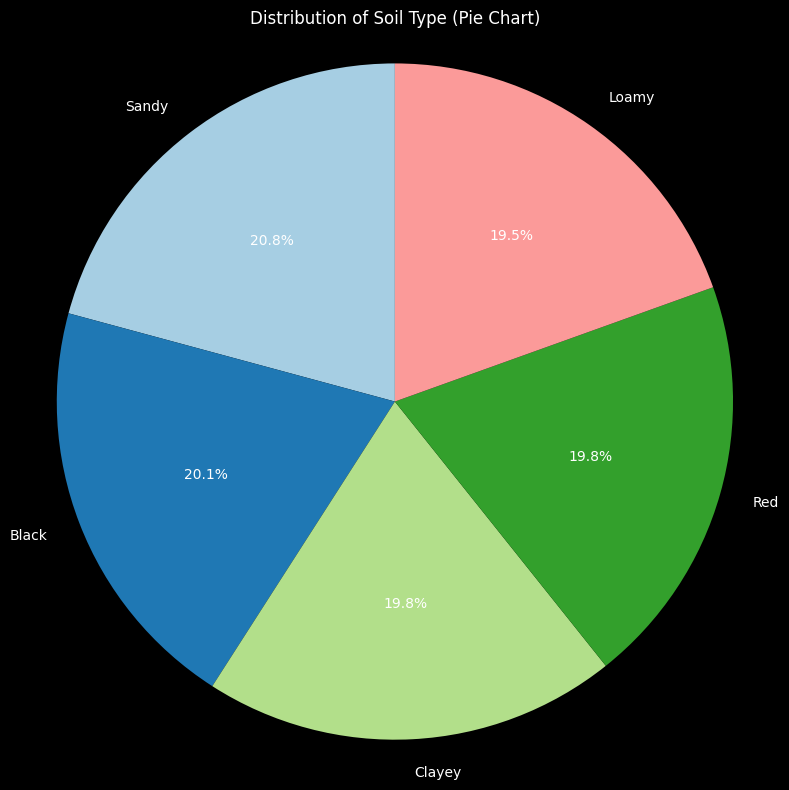

Statistics for Soil Type:
Number of Unique Values: 5
Missing Values in Soil Type: 0


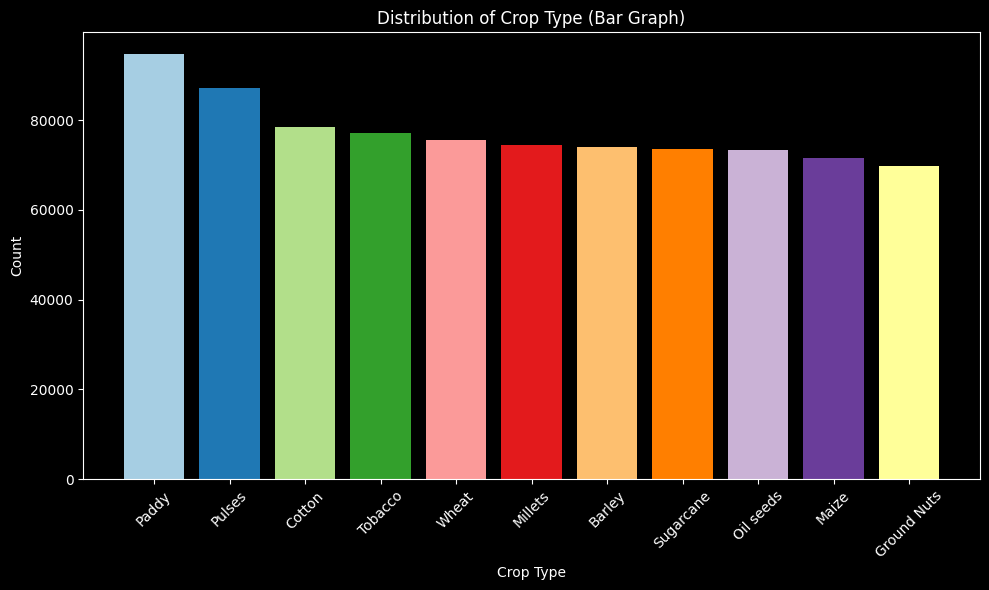

Statistics for Crop Type:
Number of Unique Values: 11
Missing Values in Crop Type: 0


In [18]:
plot_categorical_features(data, Non_Numeric_Cols)

* Numeric-Variables vs Categorical Columns : 'Temparature', 'Humidity', 'Moisture', 'Nitrogen', 'Potassium', 'Phosphorous' vs  'Soil Type', 'Crop Type'

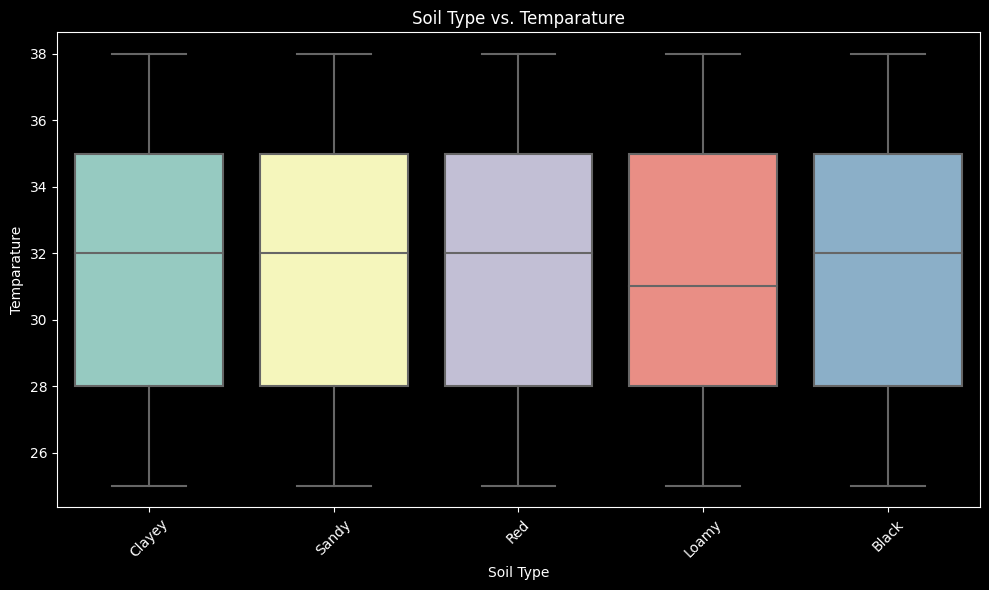

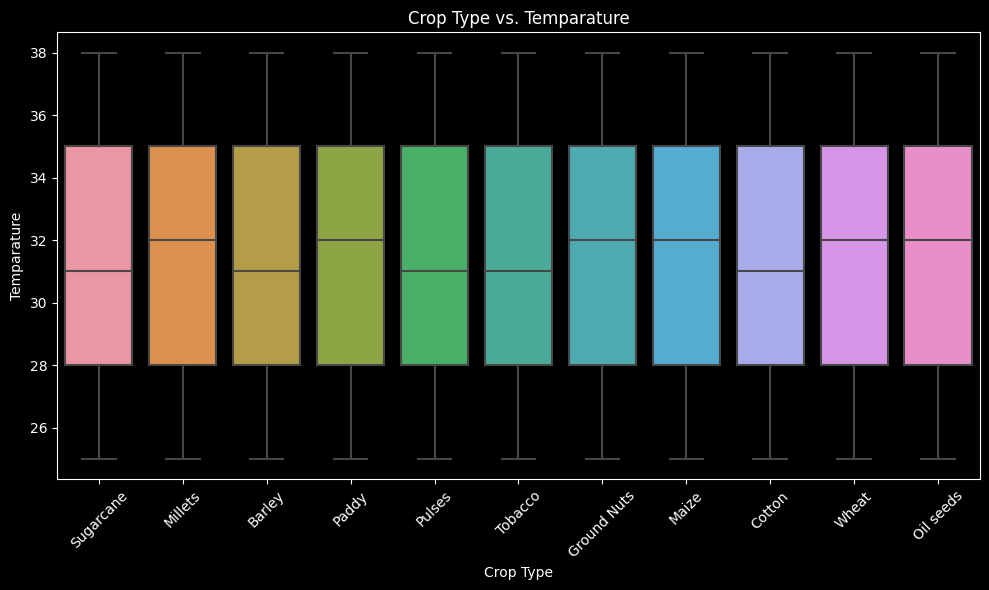

In [19]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Temparature")

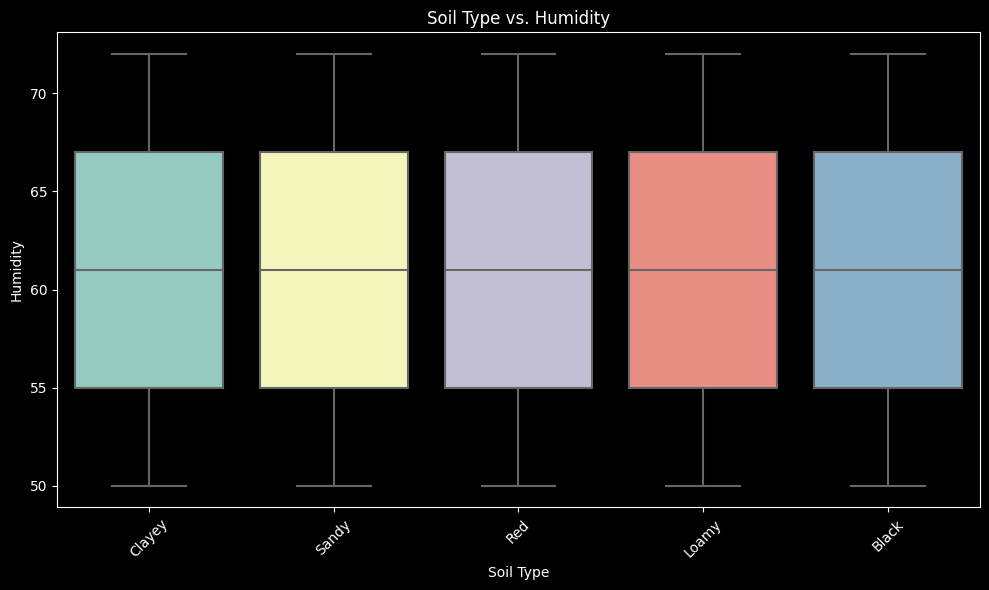

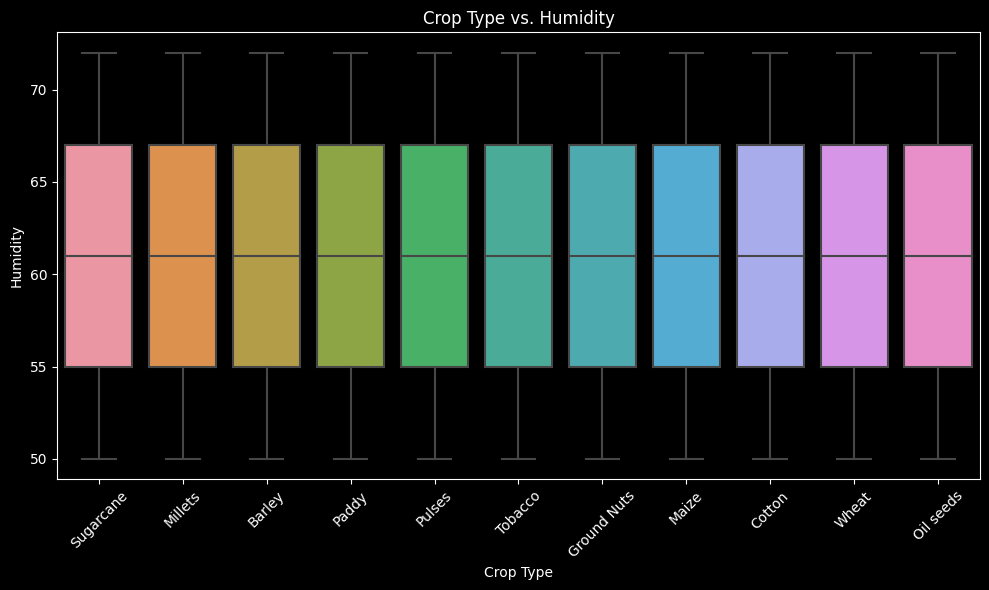

In [20]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Humidity")

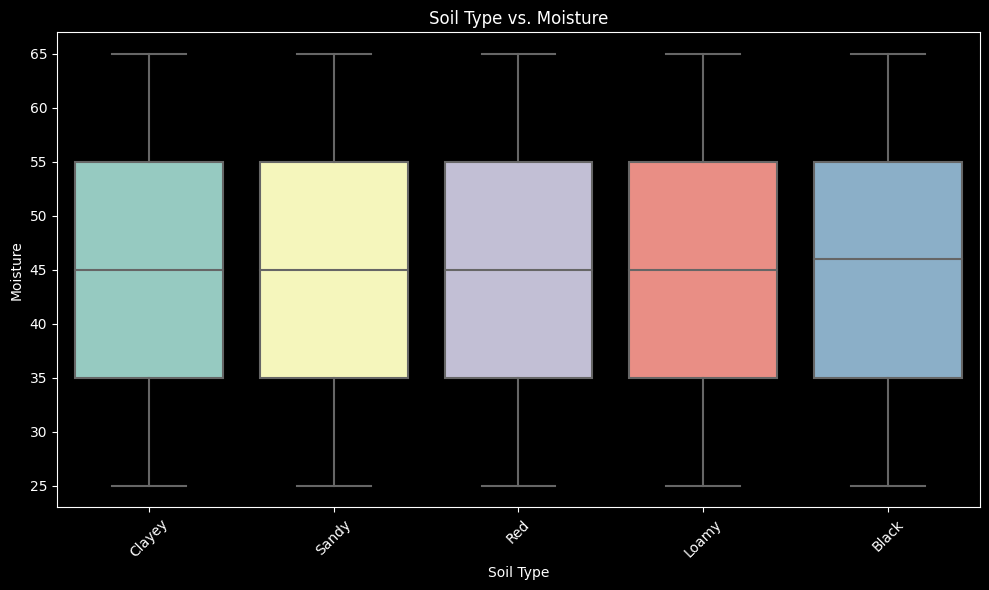

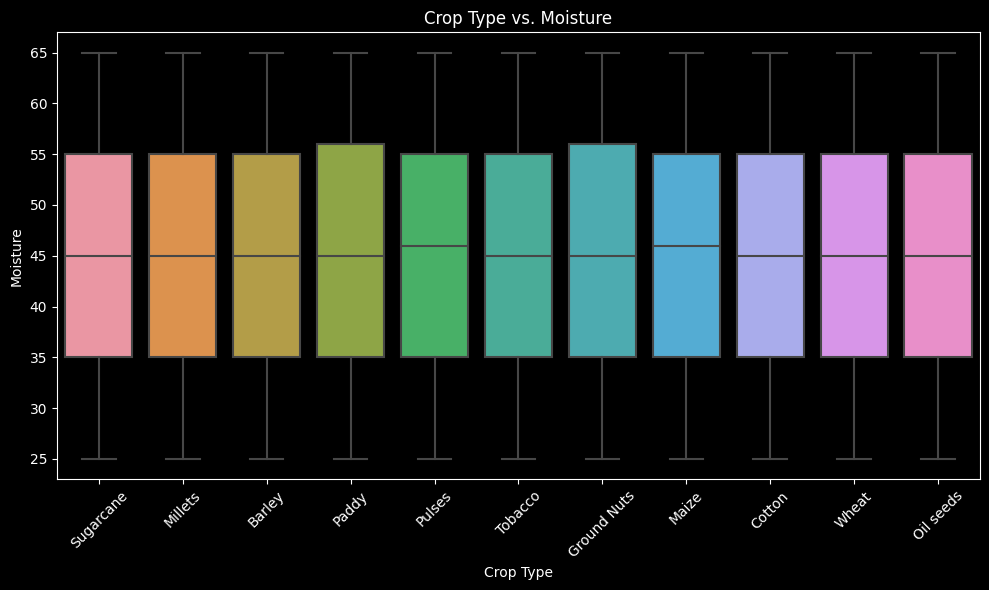

In [21]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Moisture")

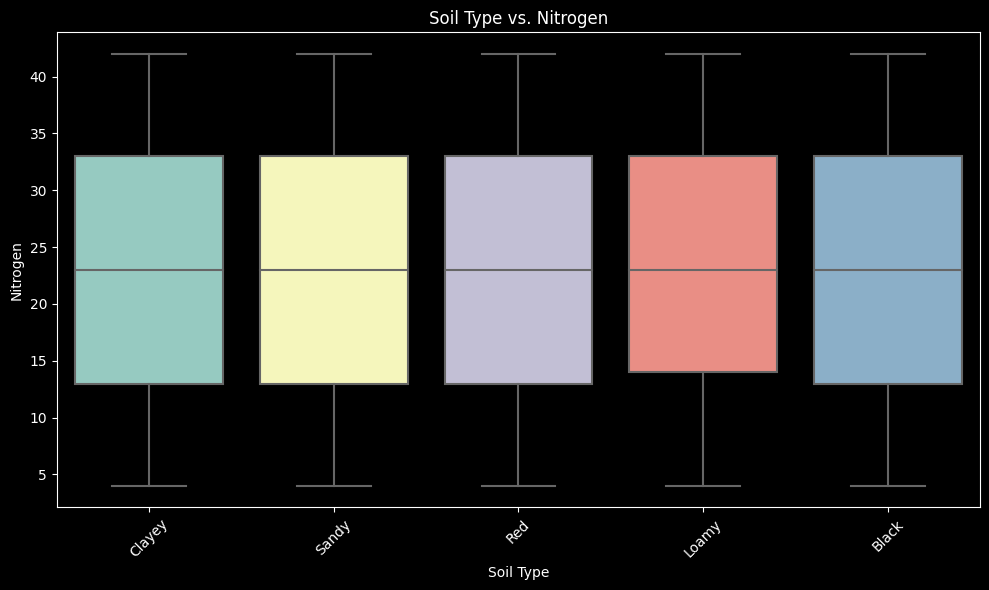

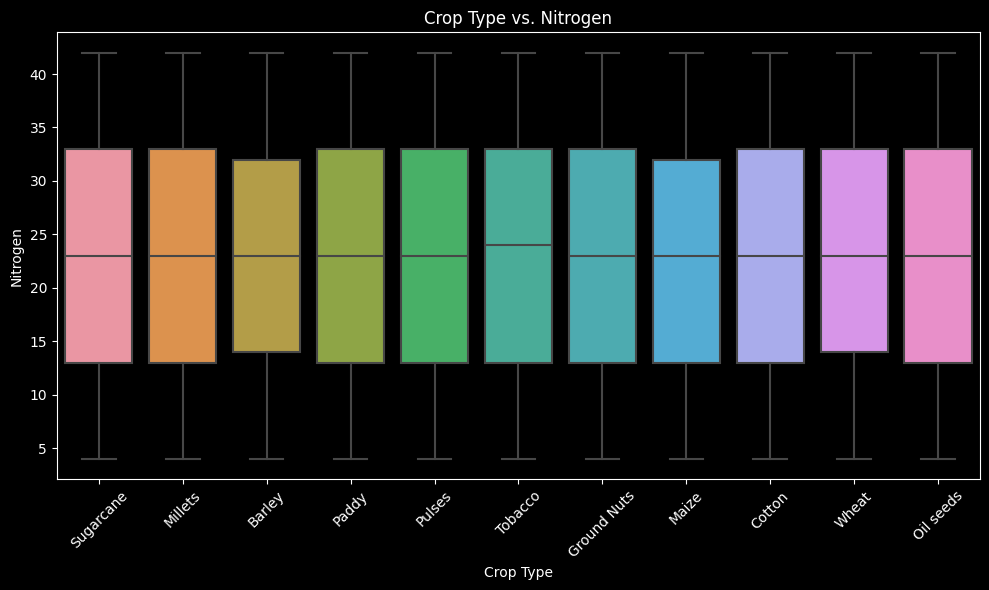

In [22]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Nitrogen")

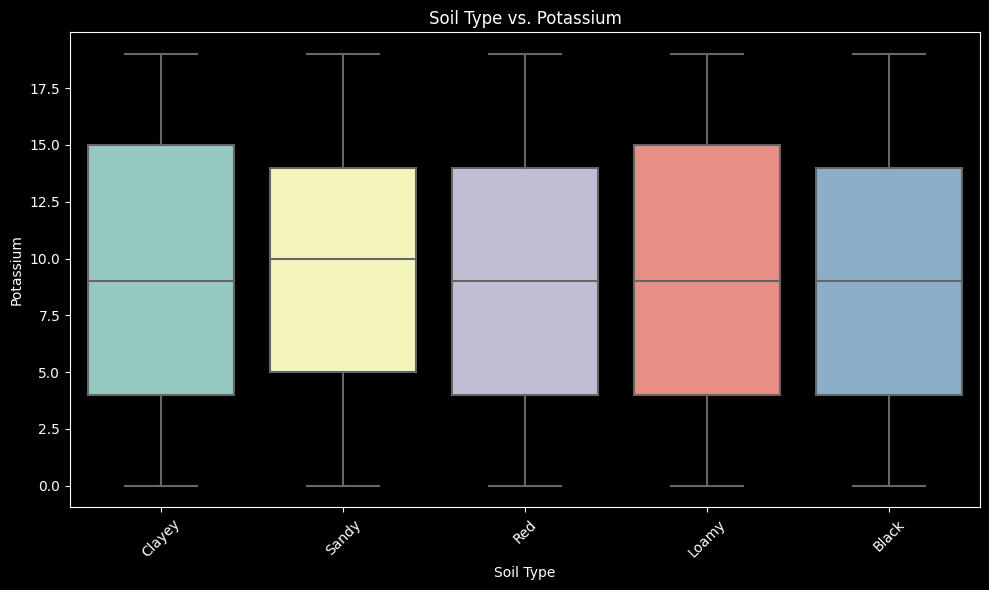

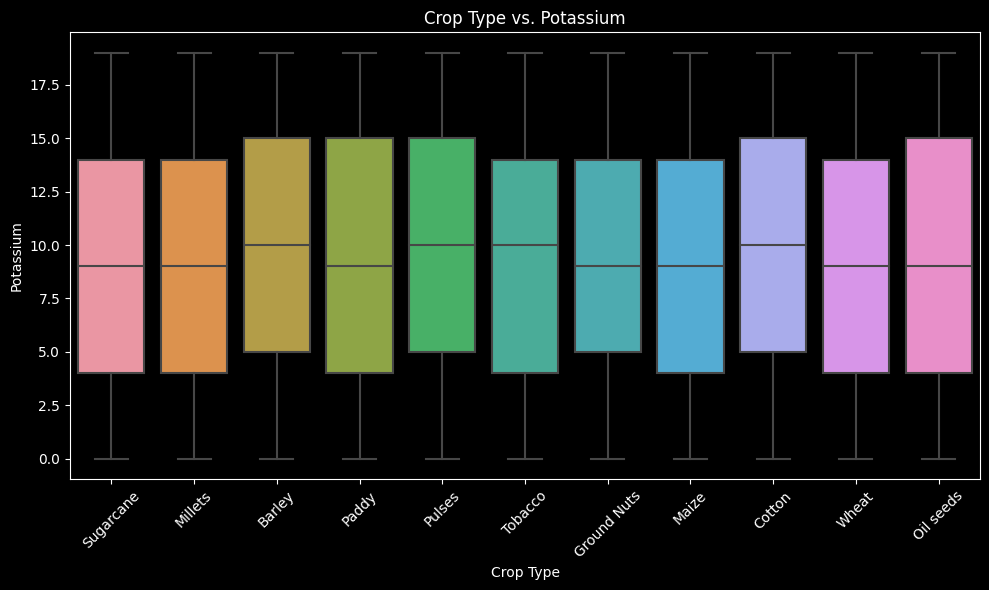

In [23]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Potassium")

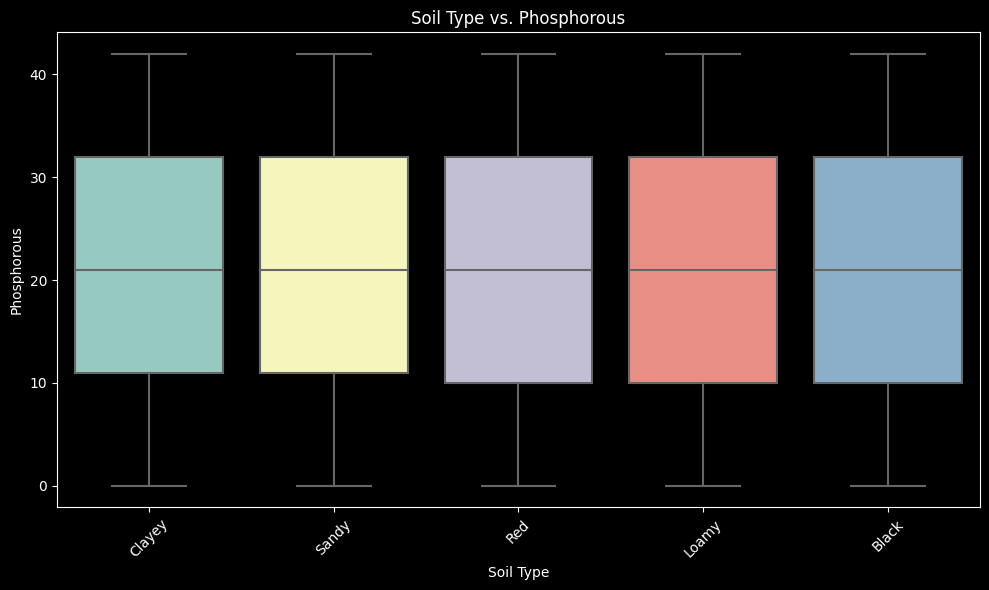

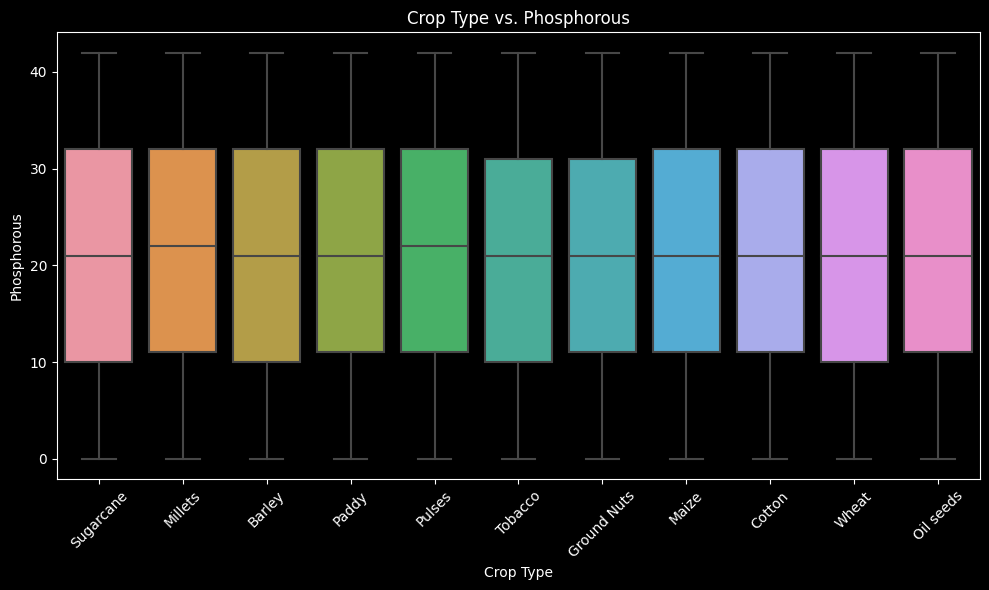

In [24]:
plot_categorical_boxplots(data, Non_Numeric_Cols, "Phosphorous")

* Univariate Analysis for Numeric Columns

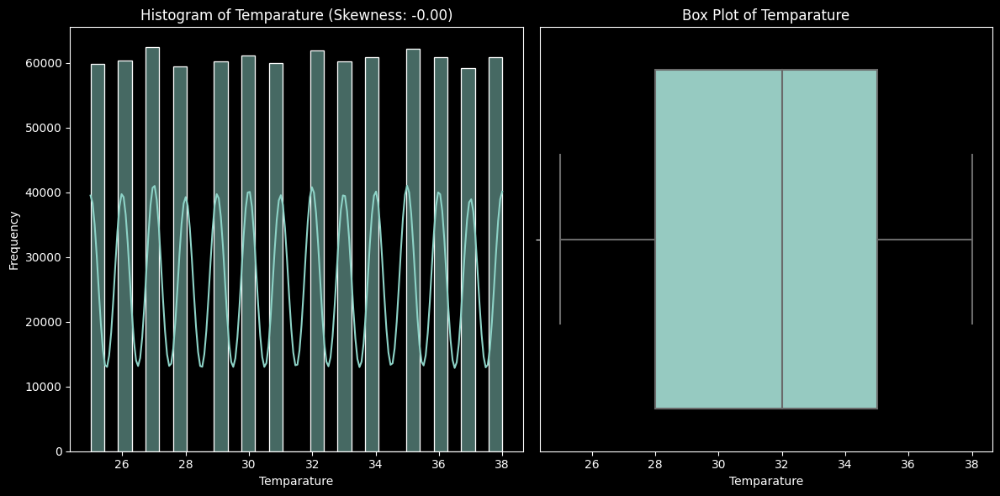


Statistics for Temparature:
Skewness: -0.00
Number of Missing Values: 0


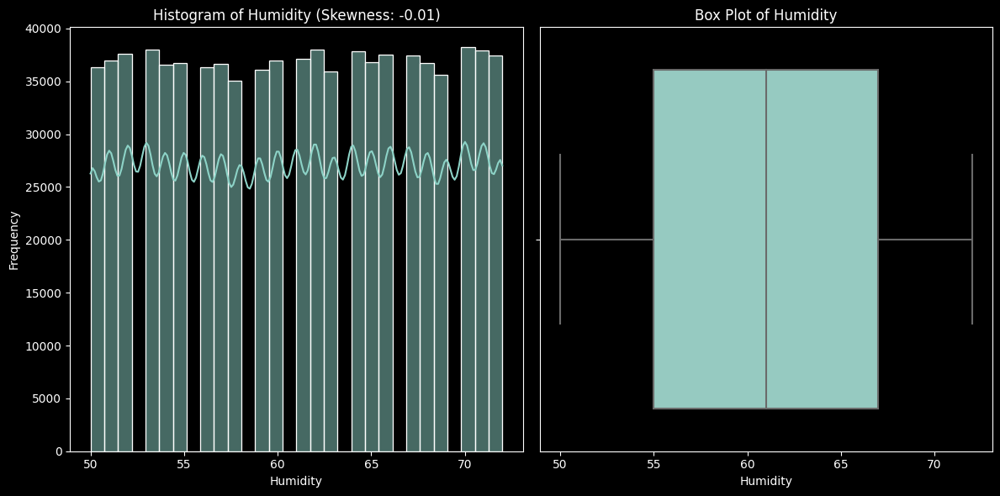


Statistics for Humidity:
Skewness: -0.01
Number of Missing Values: 0


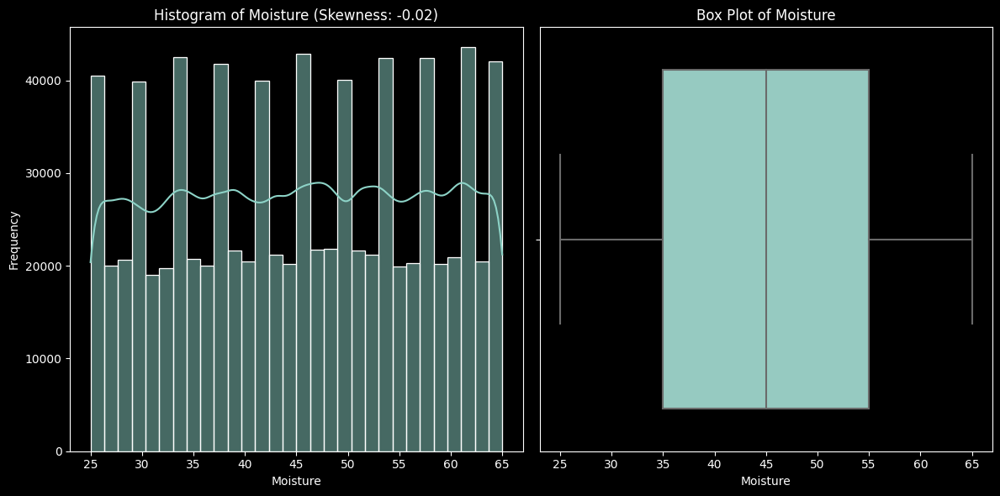


Statistics for Moisture:
Skewness: -0.02
Number of Missing Values: 0


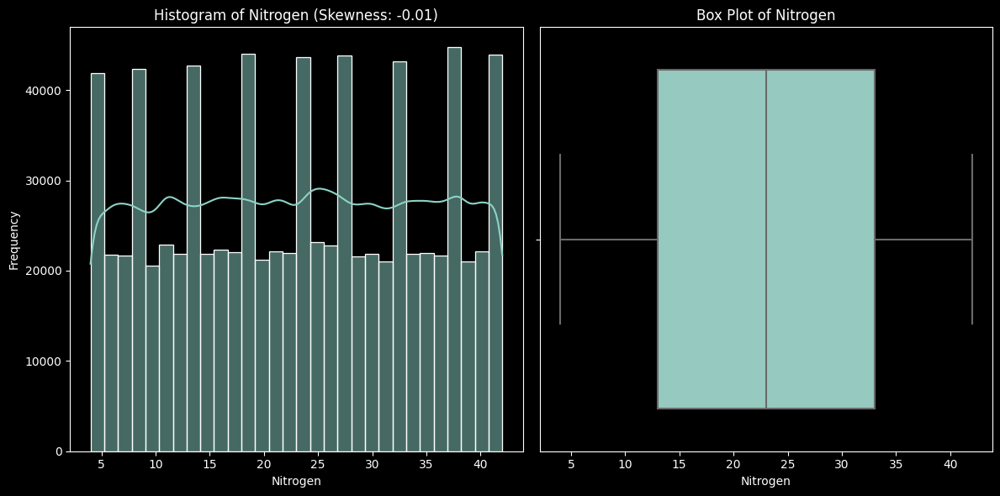


Statistics for Nitrogen:
Skewness: -0.01
Number of Missing Values: 0


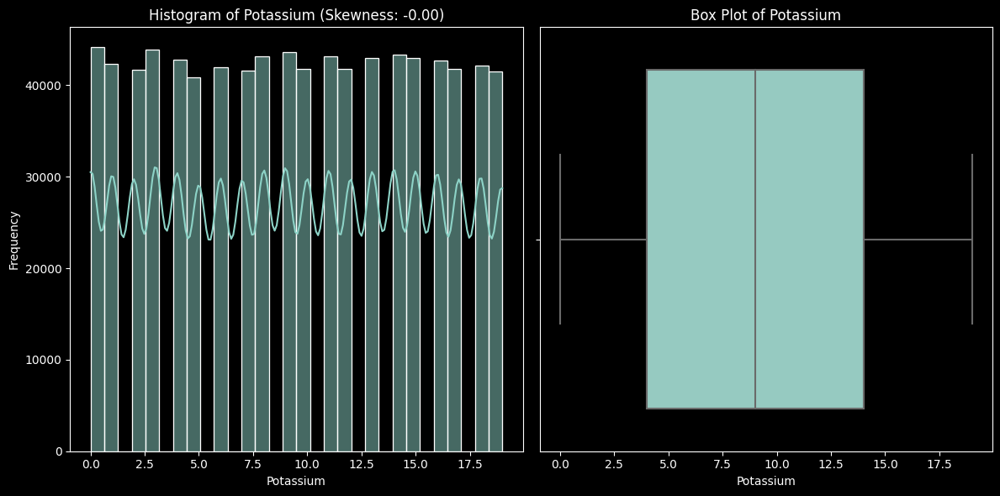


Statistics for Potassium:
Skewness: -0.00
Number of Missing Values: 0


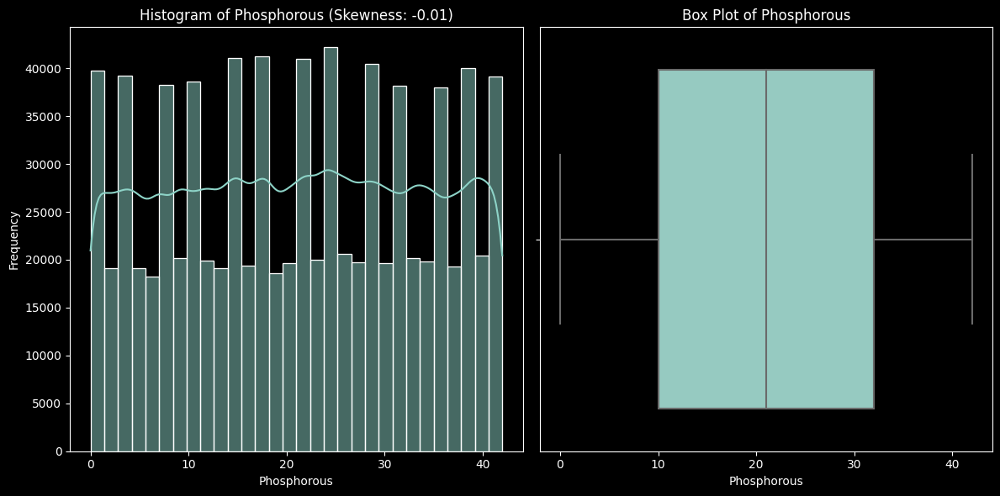


Statistics for Phosphorous:
Skewness: -0.01
Number of Missing Values: 0


In [25]:
plot_numeric_features(data, Numeric_Cols, apply_box_cox=True)

* Correlation HeatMaps For Numeric Columns

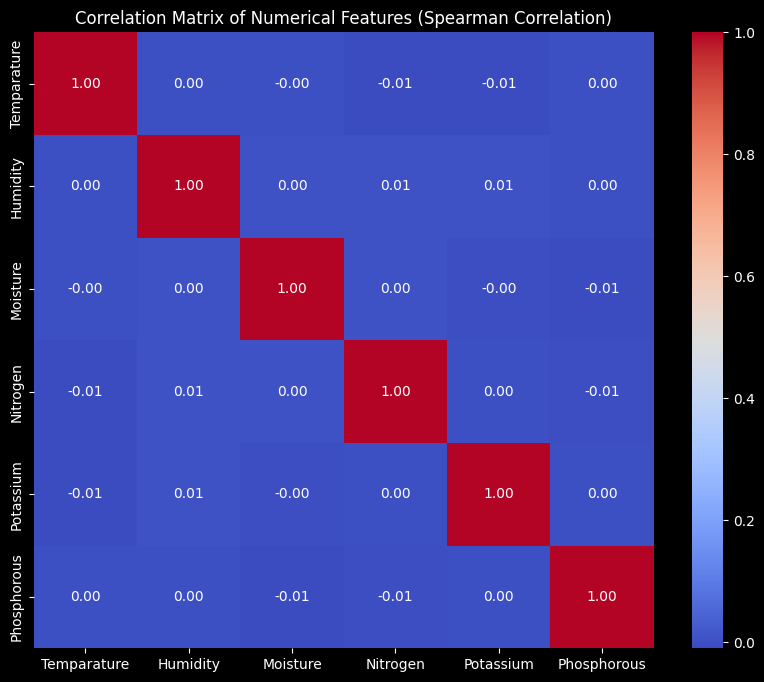

In [26]:
plot_correlation_heatmap(data, Numeric_Cols, corr_type="spearman")

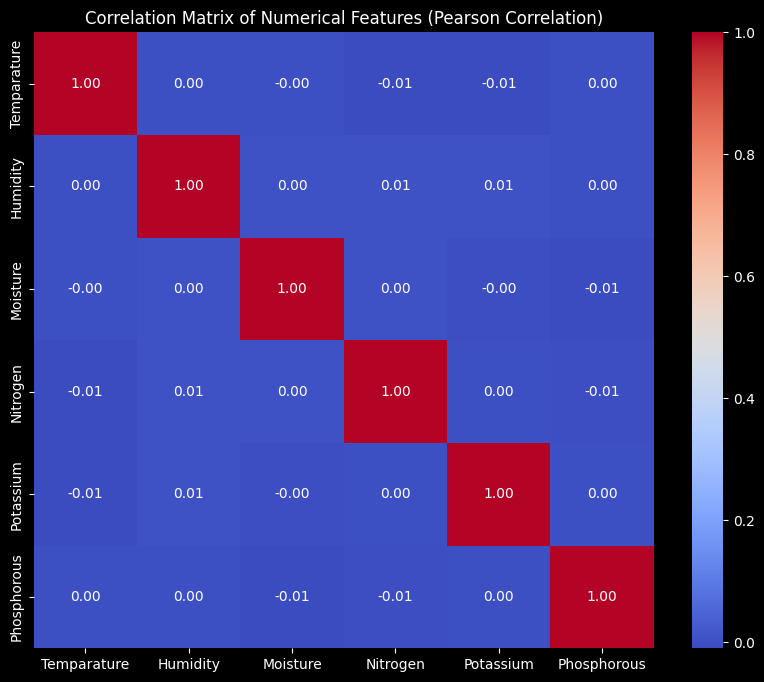

In [27]:
plot_correlation_heatmap(data, Numeric_Cols, corr_type="pearson")

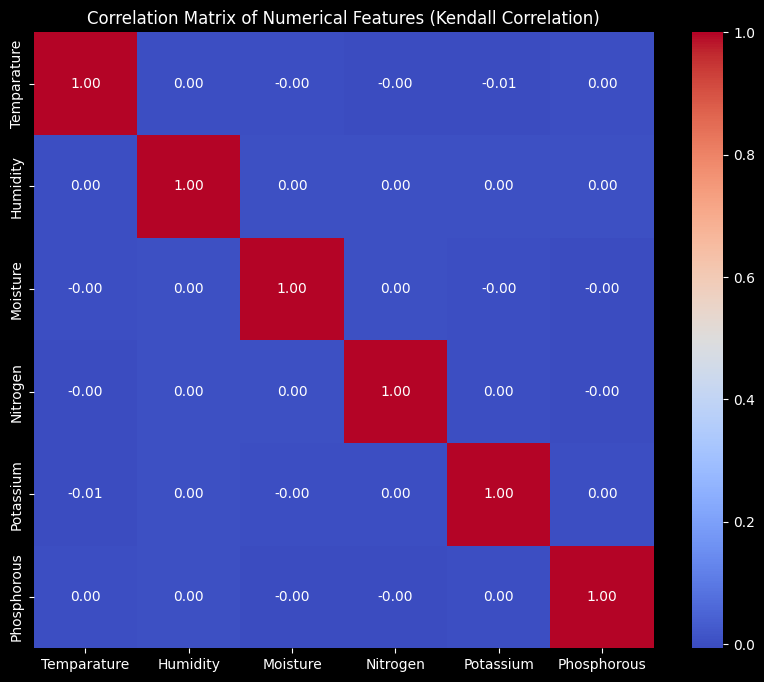

In [28]:
plot_correlation_heatmap(data, Numeric_Cols, corr_type="kendall")

* Pair-wise Numeric Distributions vs Any Categoric Column

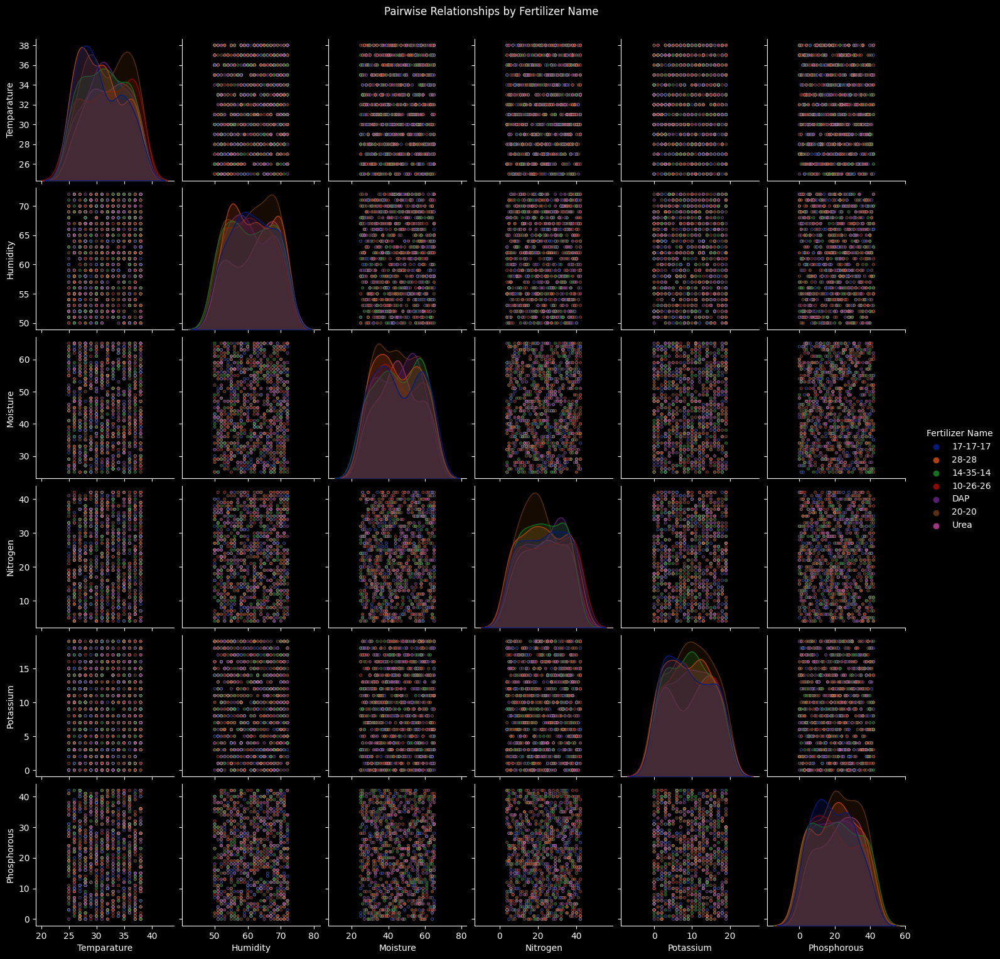

In [32]:
generate_pair_plot_for_numeric_columns(data, Numeric_Cols+['Fertilizer Name'], hue='Fertilizer Name', sample_size=1000)

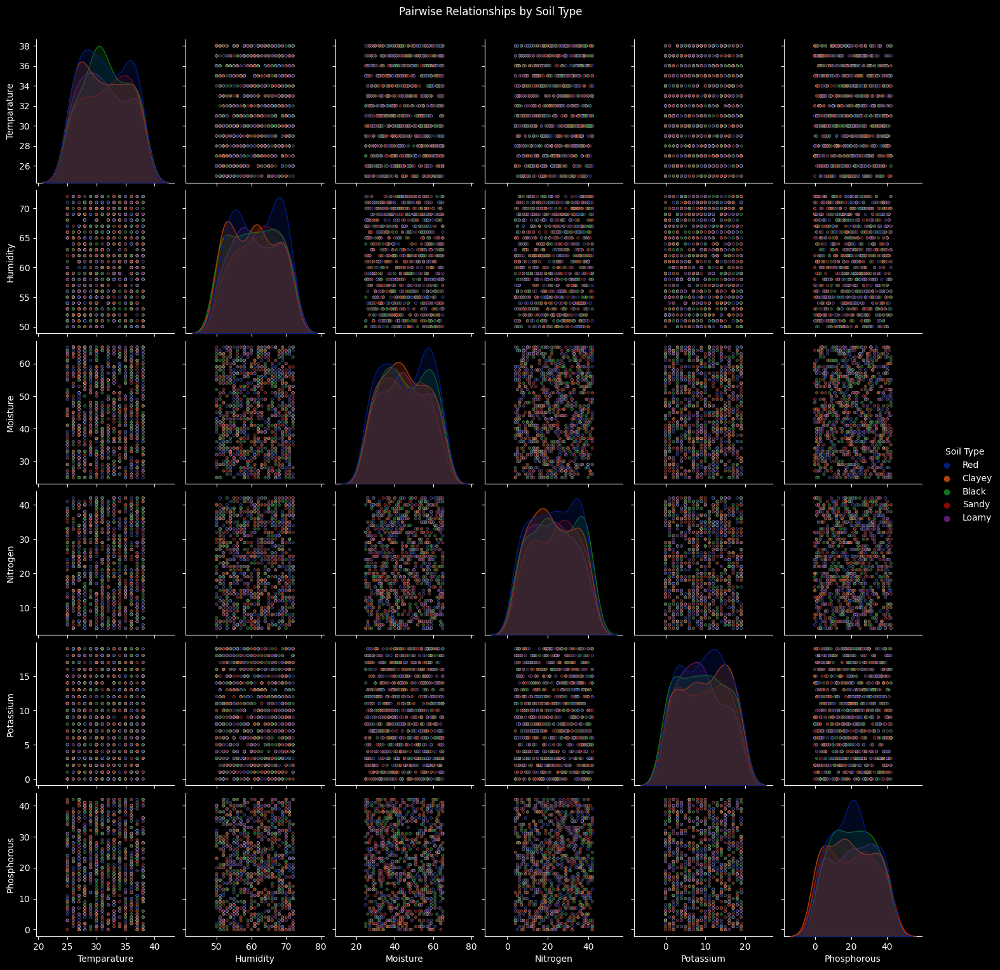

In [33]:
generate_pair_plot_for_numeric_columns(data, Numeric_Cols+['Soil Type'], hue='Soil Type', sample_size=1000)

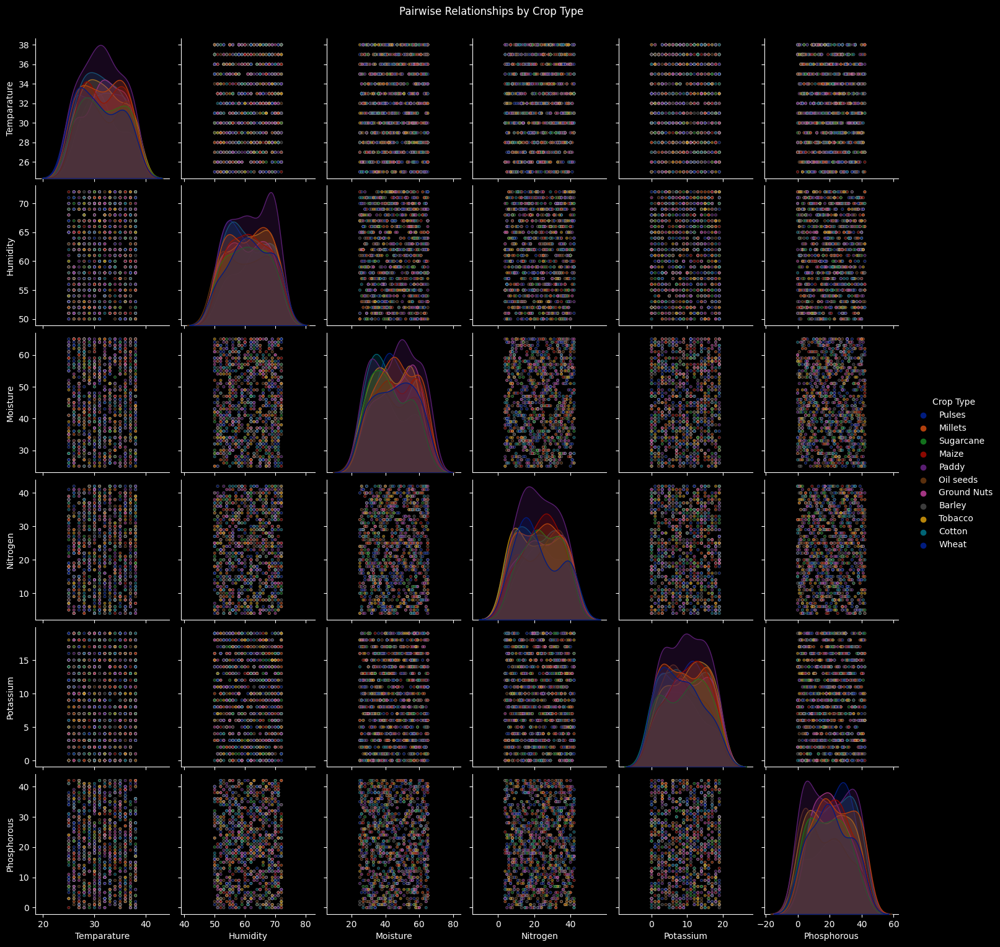

In [34]:
generate_pair_plot_for_numeric_columns(data, Numeric_Cols+['Crop Type'], hue='Crop Type', sample_size=1000)

* 2 Category Columns vs Any Numeric Column

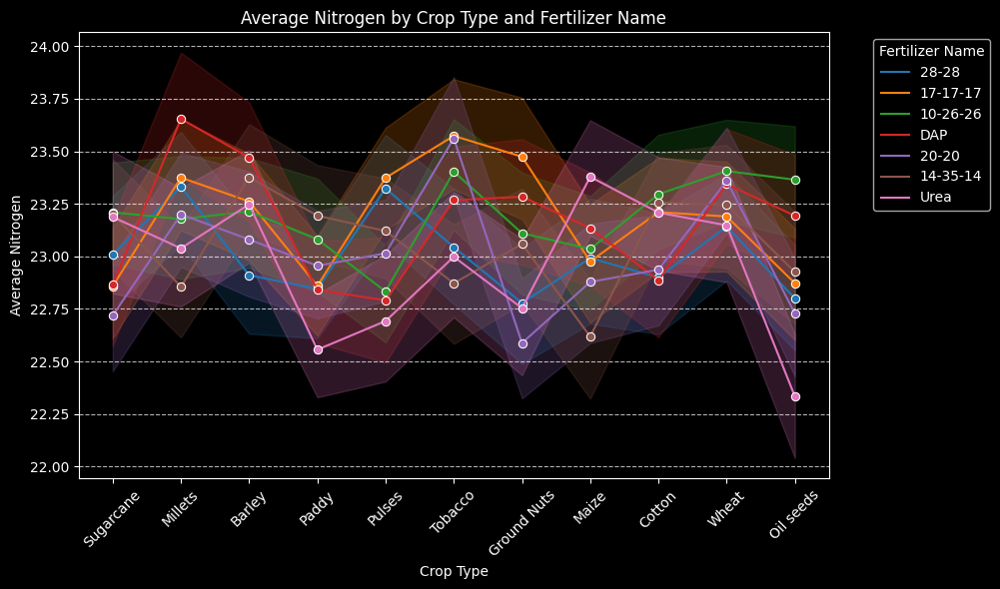

In [41]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Nitrogen',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

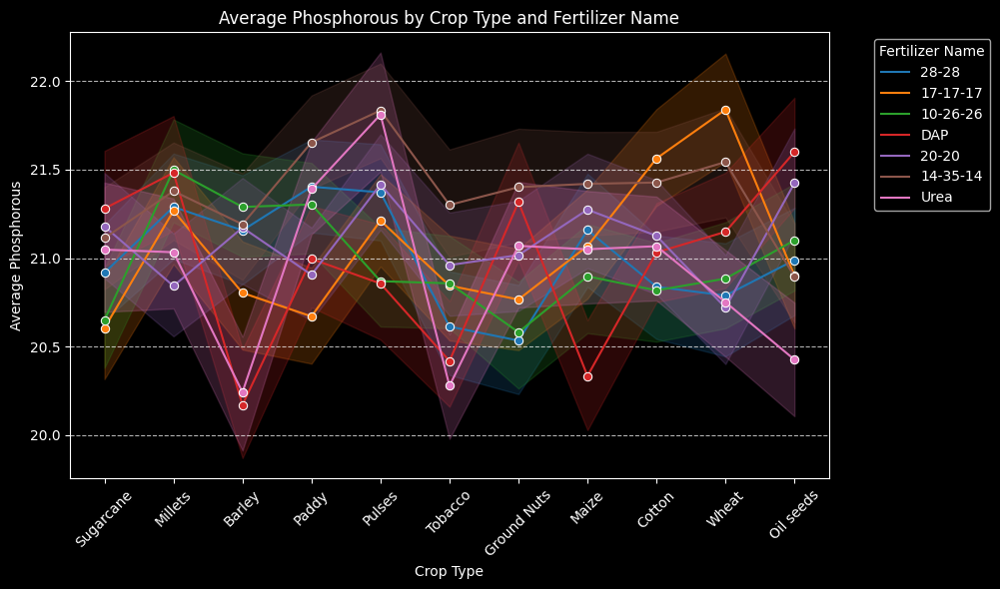

In [43]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Phosphorous',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

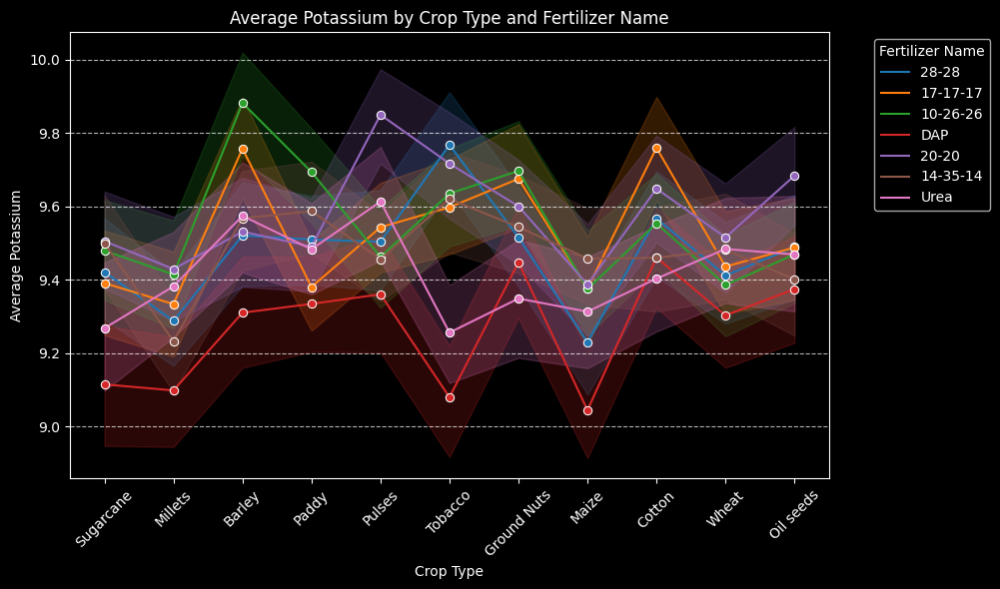

In [44]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Potassium',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

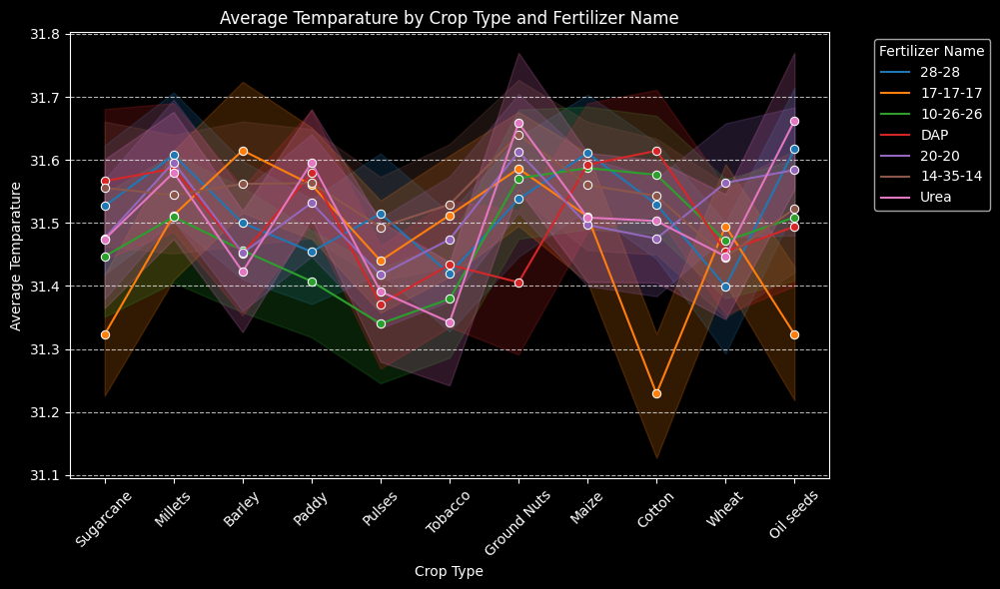

In [49]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Temparature',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

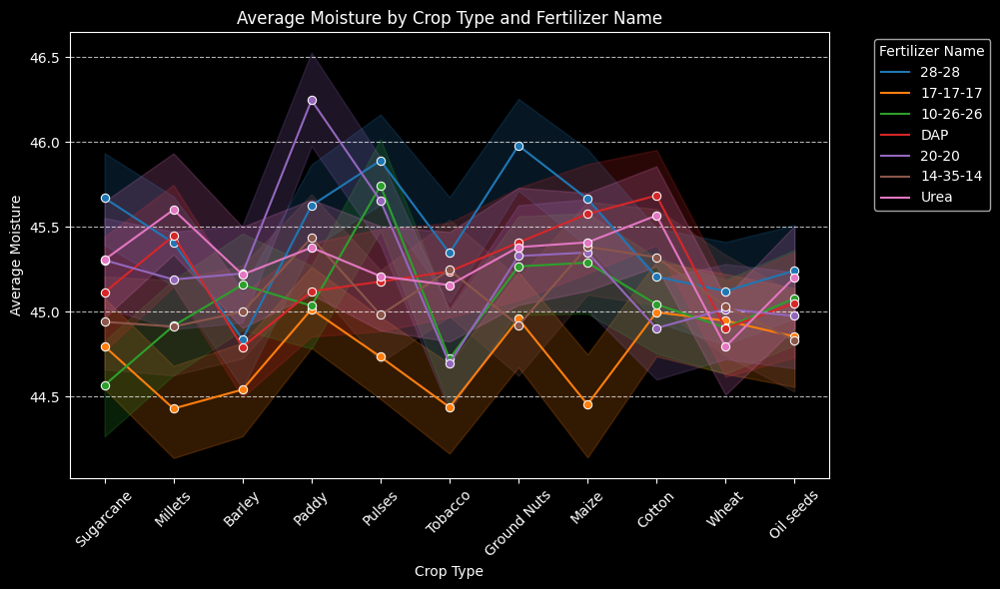

In [47]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Moisture',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

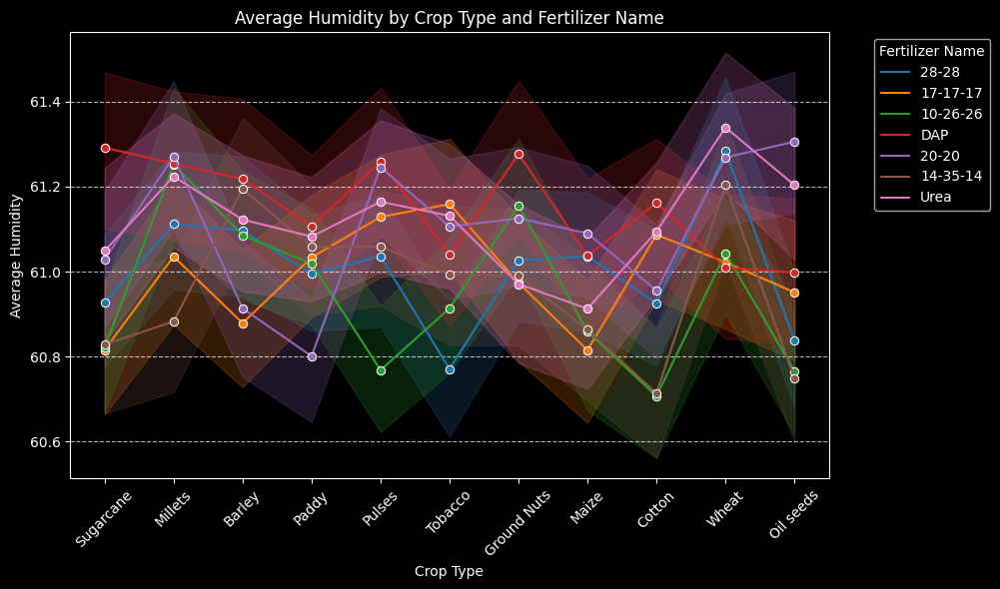

In [50]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Crop Type',
    cat_col2='Fertilizer Name',
    numeric_col='Humidity',
    cat1_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

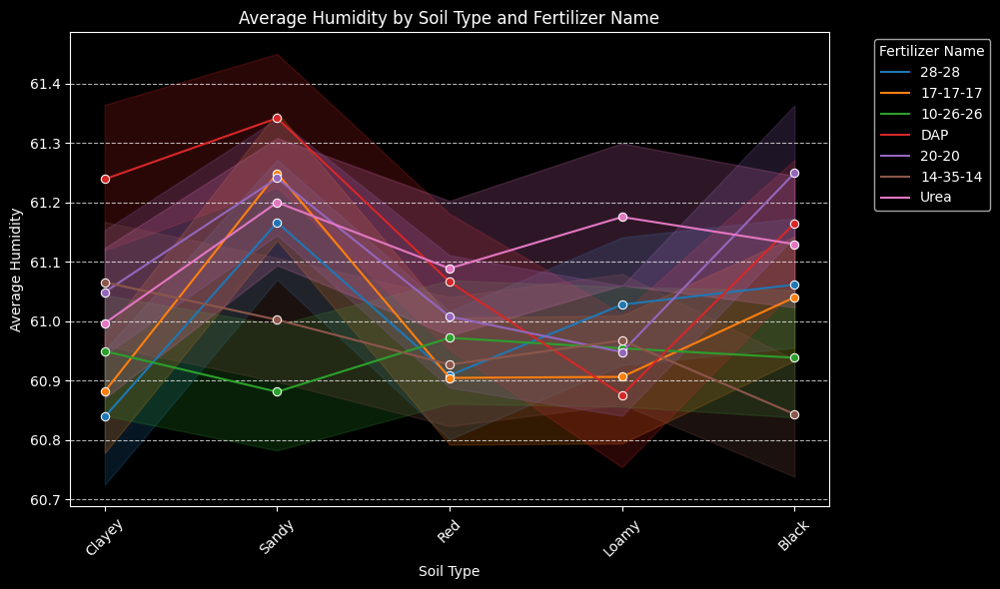

In [51]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Humidity',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

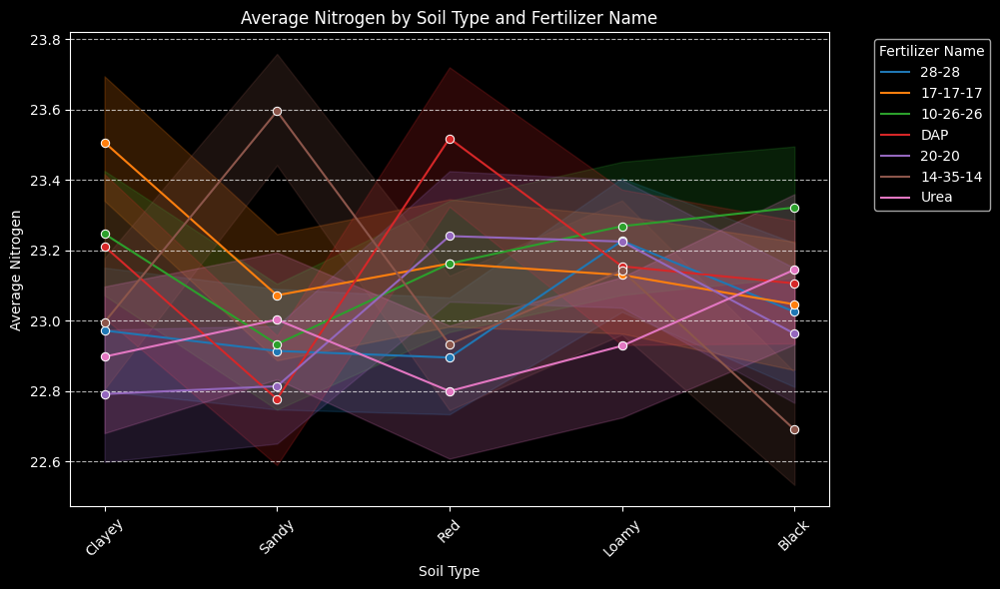

In [52]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Nitrogen',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

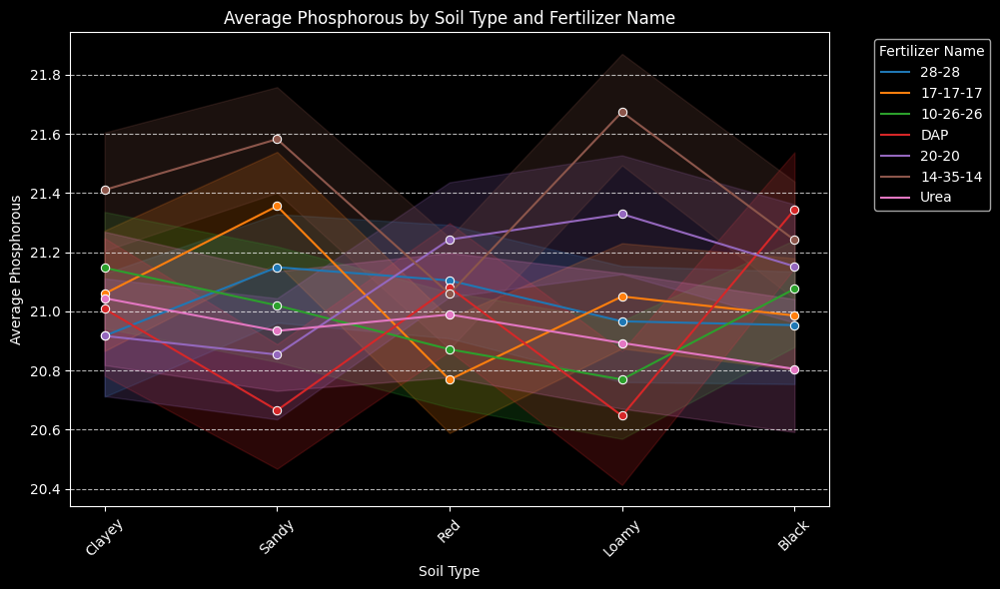

In [53]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Phosphorous',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

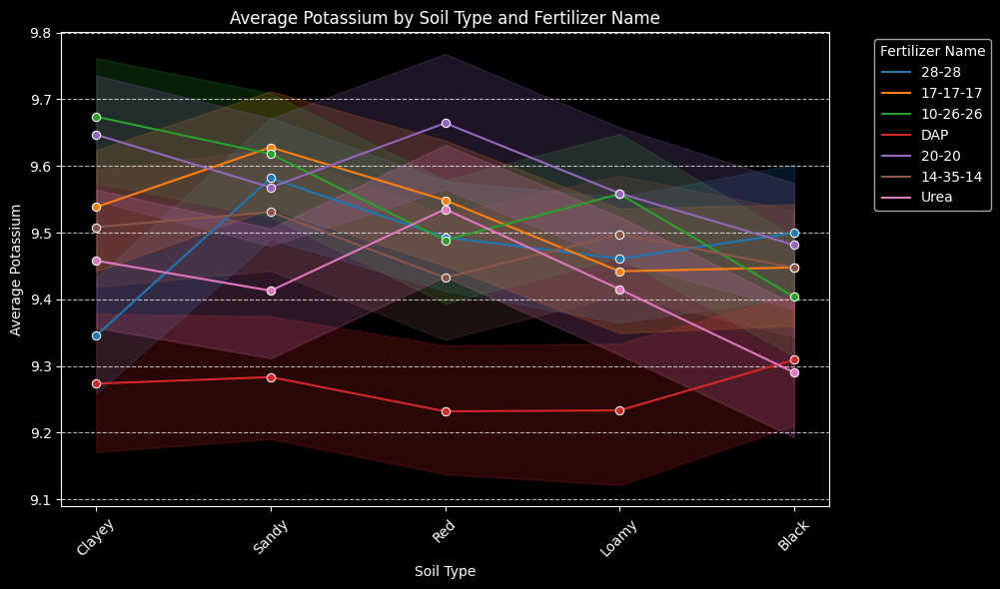

In [54]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Potassium',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

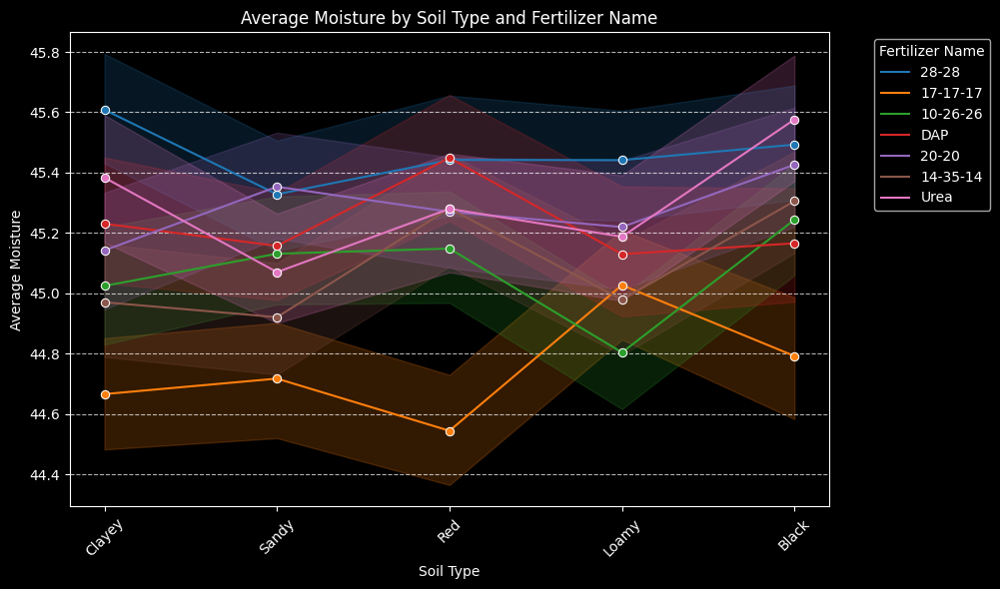

In [55]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Moisture',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

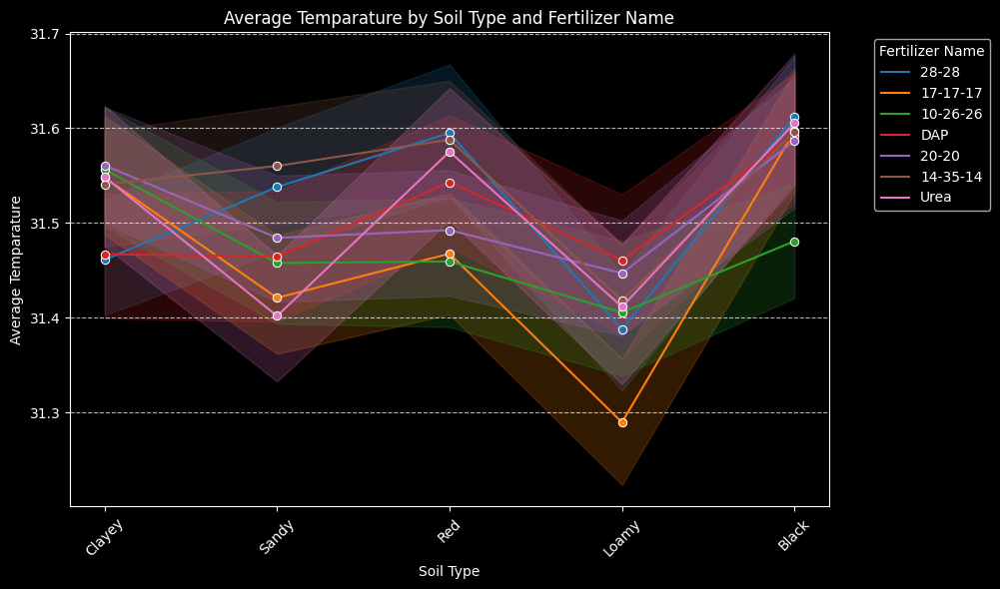

In [56]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Fertilizer Name',
    numeric_col='Temparature',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['28-28', '17-17-17', '10-26-26', 'DAP', '20-20', '14-35-14', 'Urea']
)

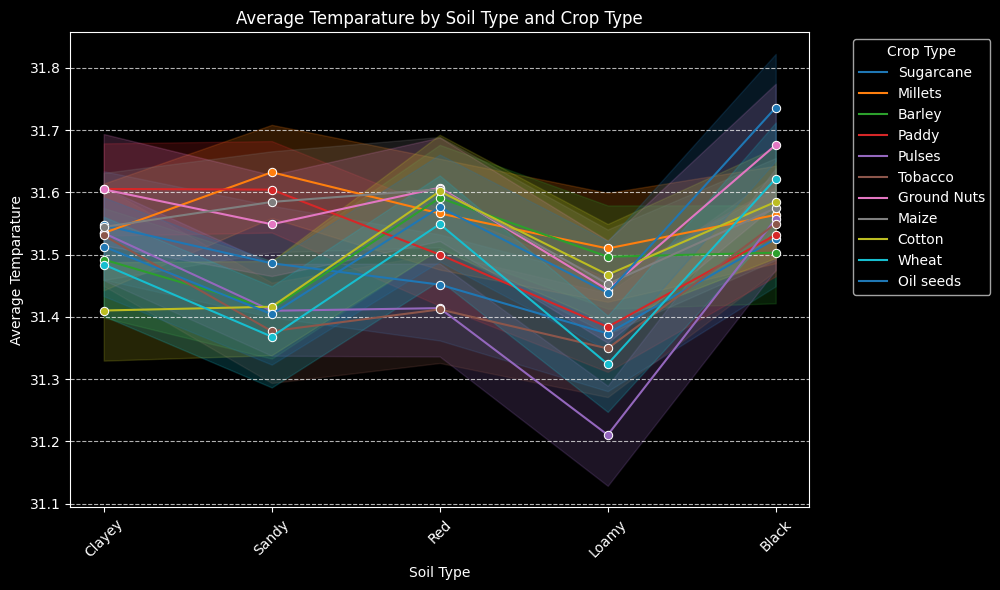

In [57]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Temparature',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

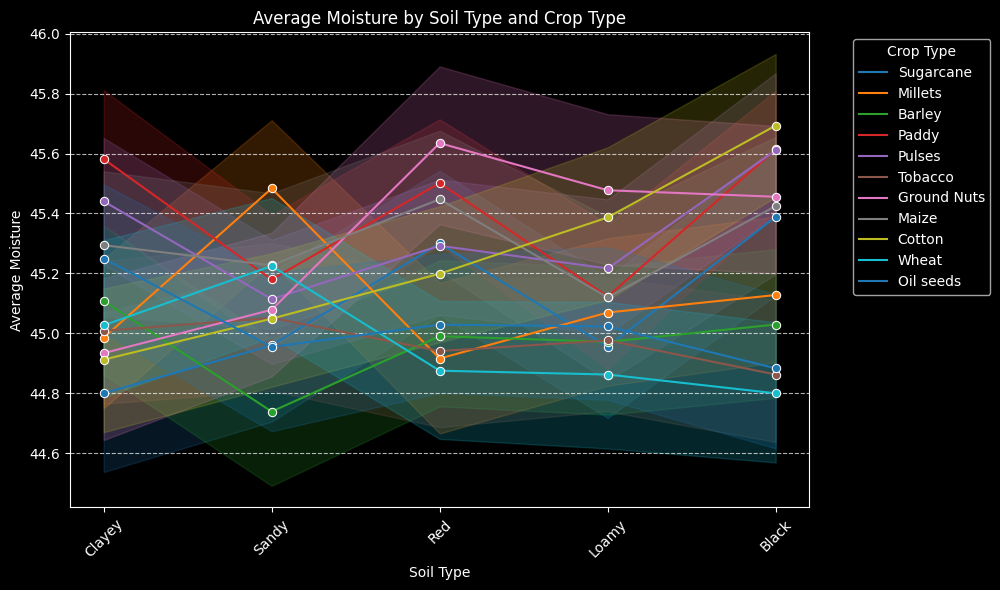

In [58]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Moisture',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

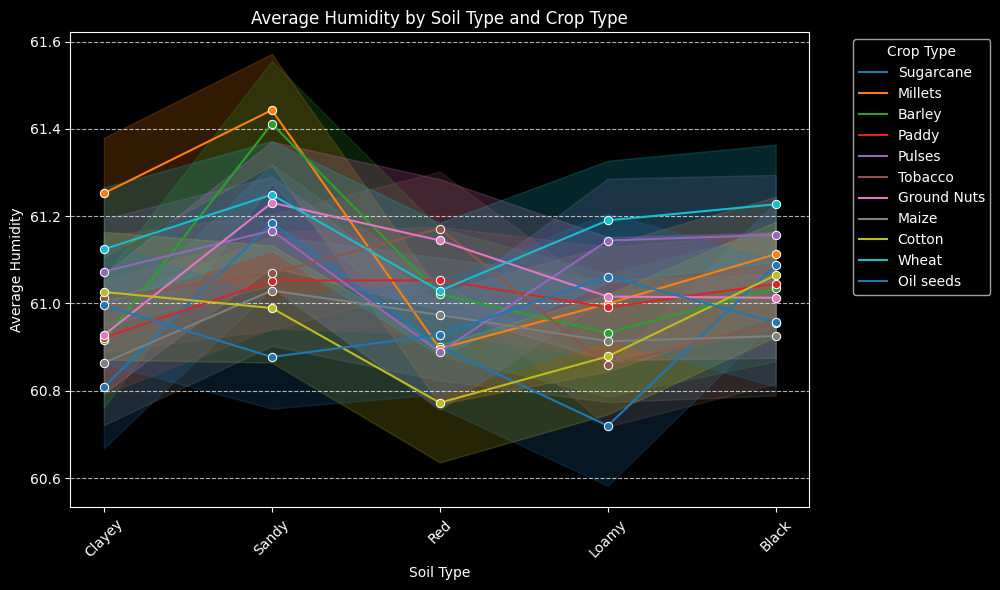

In [59]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Humidity',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

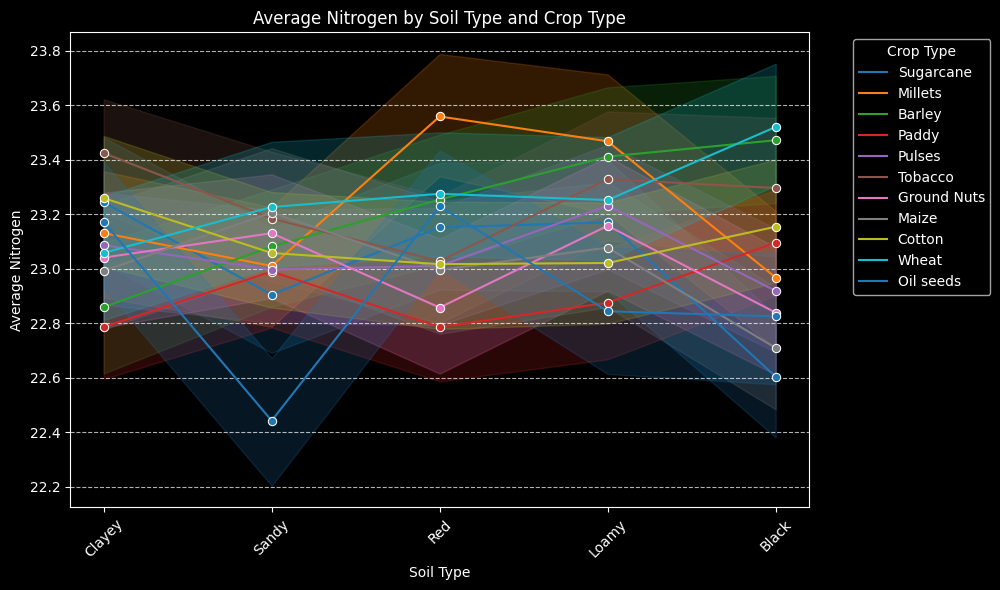

In [60]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Nitrogen',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

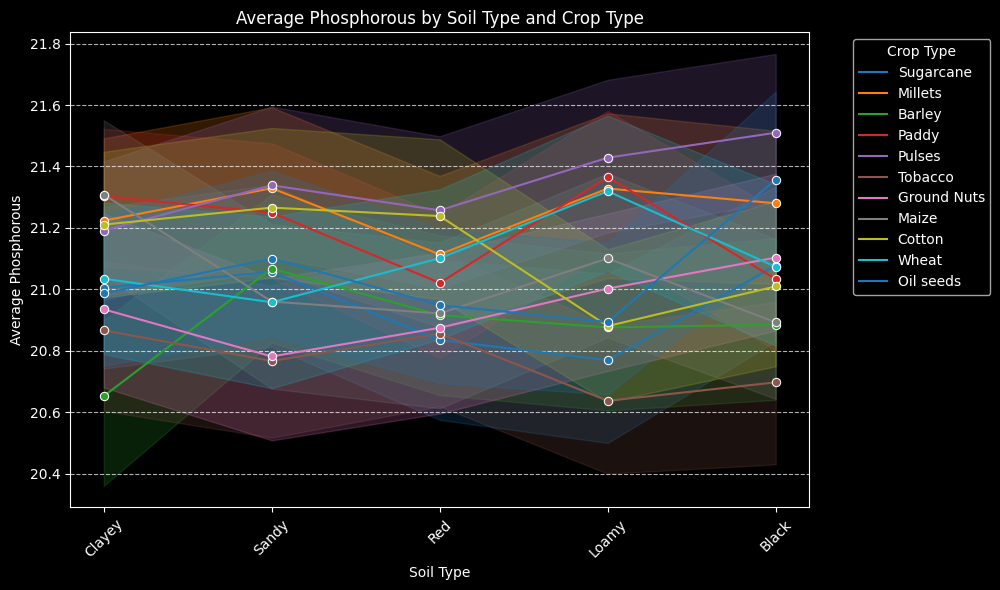

In [61]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Phosphorous',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

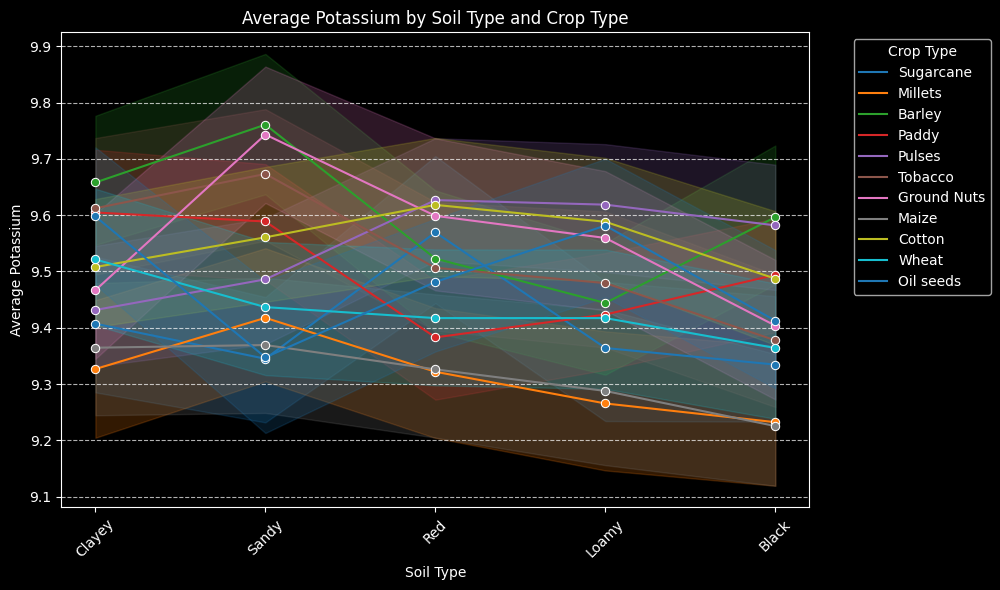

In [62]:
generate_categorical_numeric_plot(
    df=data,
    cat_col1='Soil Type',
    cat_col2='Crop Type',
    numeric_col='Potassium',
    cat1_order=['Clayey', 'Sandy', 'Red', 'Loamy', 'Black'],
    cat2_order=['Sugarcane', 'Millets', 'Barley', 'Paddy', 'Pulses', 'Tobacco', 'Ground Nuts', 'Maize', 'Cotton', 'Wheat', 'Oil seeds']
)

* Correlation Scatter plot on buckets and point size indicative of population with trend line)

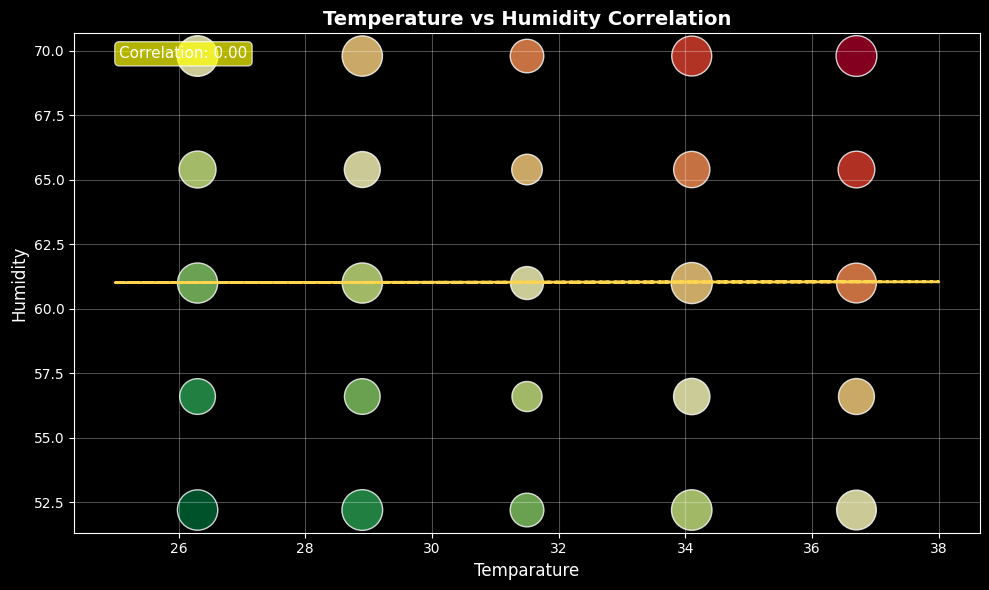

0.0015600022594441975

In [64]:
plot_correlation_scatter(train, 'Temparature', 'Humidity', title='Temperature vs Humidity Correlation')

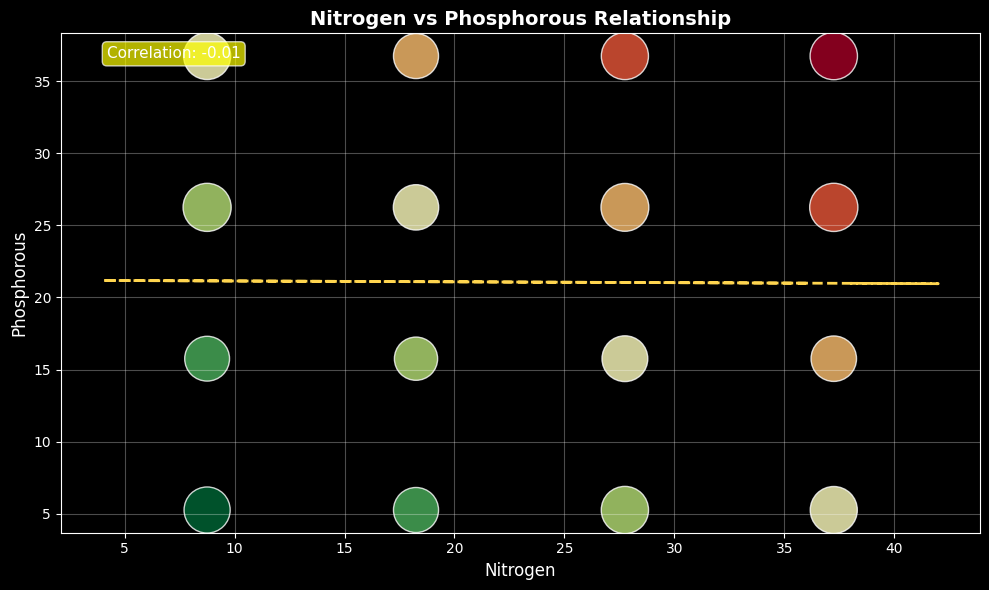

-0.0053370003917438645

In [65]:
plot_correlation_scatter(train, 'Nitrogen', 'Phosphorous', bins_x=4, bins_y=4, 
                        title='Nitrogen vs Phosphorous Relationship')

* Average Radar Charts

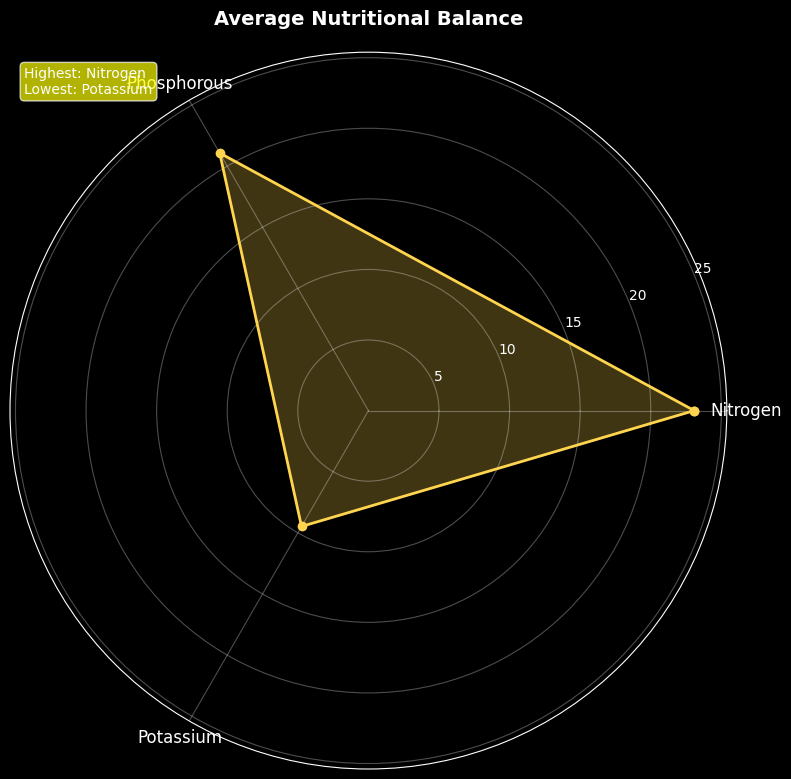

{'Nitrogen': 23.081215294117648,
 'Phosphorous': 21.066197647058825,
 'Potassium': 9.477581176470588}

In [66]:
plot_radar_chart(train, ['Nitrogen', 'Phosphorous', 'Potassium'], title='Average Nutritional Balance')

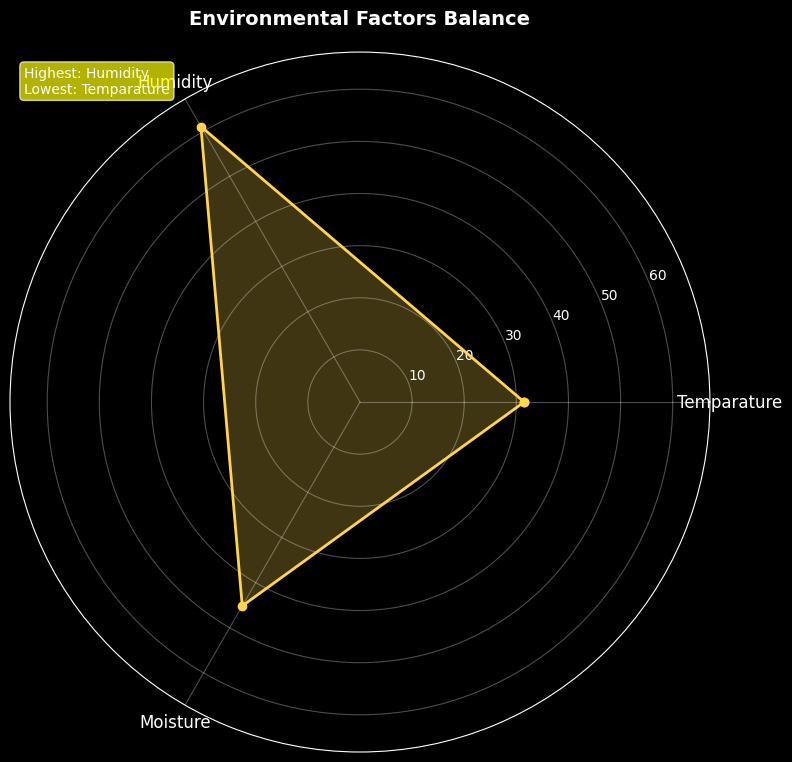

{'Temparature': 31.50353411764706,
 'Humidity': 61.032664705882354,
 'Moisture': 45.16288705882353}

In [67]:
plot_radar_chart(train, ['Temparature', 'Humidity', 'Moisture'], 
                title='Environmental Factors Balance')

* Grouped Bar Charts

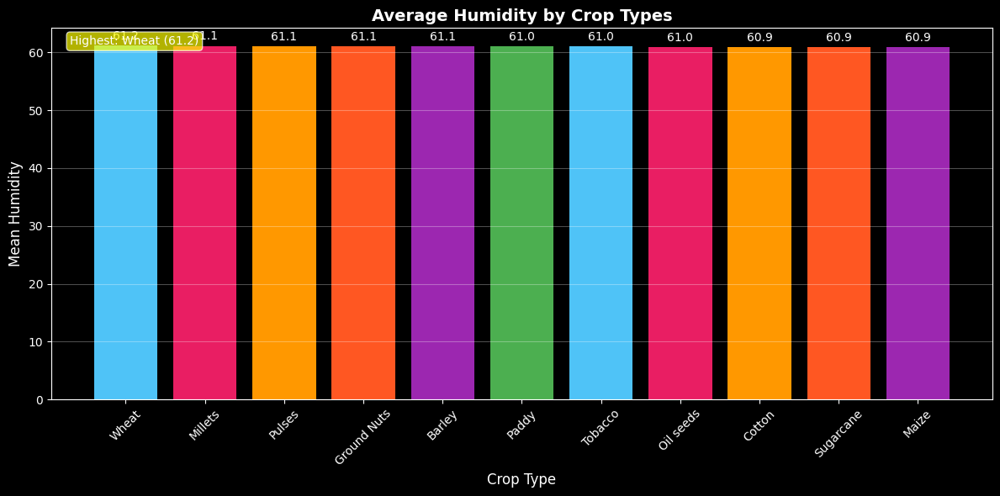

Crop Type
Wheat          61.164257
Millets        61.141903
Pulses         61.086004
Ground Nuts    61.069050
Barley         61.068704
Paddy          61.014011
Tobacco        61.013157
Oil seeds      60.963169
Cotton         60.946498
Sugarcane      60.946434
Maize          60.942276
Name: Humidity, dtype: float64

In [69]:
plot_grouped_bar(train, 'Crop Type', 'Humidity', title='Average Humidity by Crop Types')

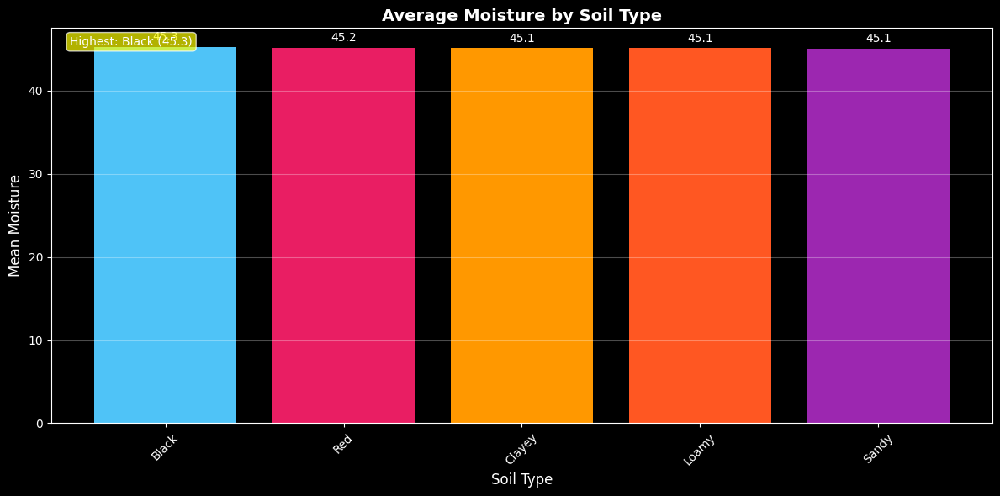

Soil Type
Black     45.278833
Red       45.195805
Clayey    45.136011
Loamy     45.106911
Sandy     45.097509
Name: Moisture, dtype: float64

In [71]:
plot_grouped_bar(train, 'Soil Type', 'Moisture', title='Average Moisture by Soil Type')

* Grouped Radar Chart

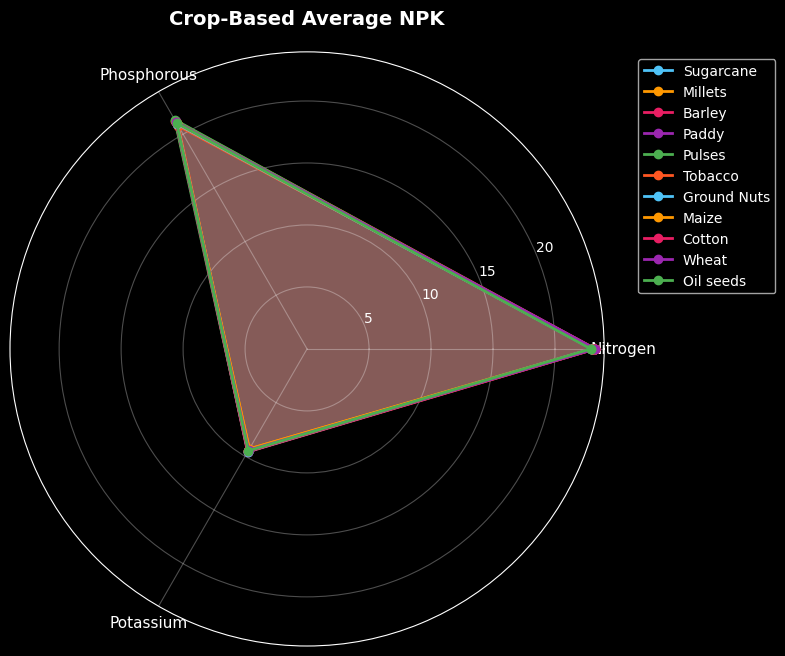

In [74]:
plot_group_radar(train, 'Crop Type', ['Nitrogen', 'Phosphorous', 'Potassium'], 
                title='Crop-Based Average NPK')

* Grouped Heatmap

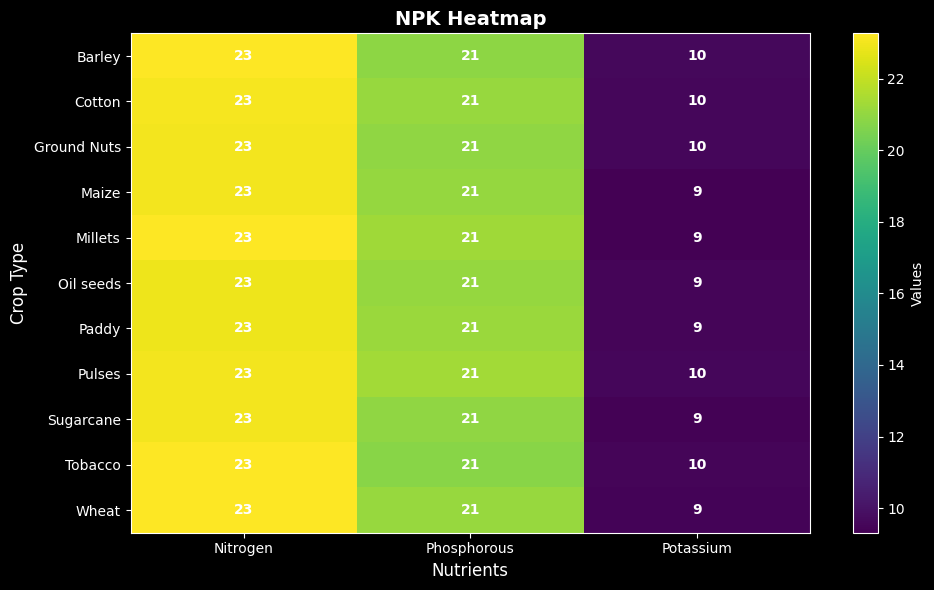

In [76]:
plot_heatmap(train, 'Crop Type', ['Nitrogen', 'Phosphorous', 'Potassium'], 
            title='NPK Heatmap')

* 3D Scatter Plot

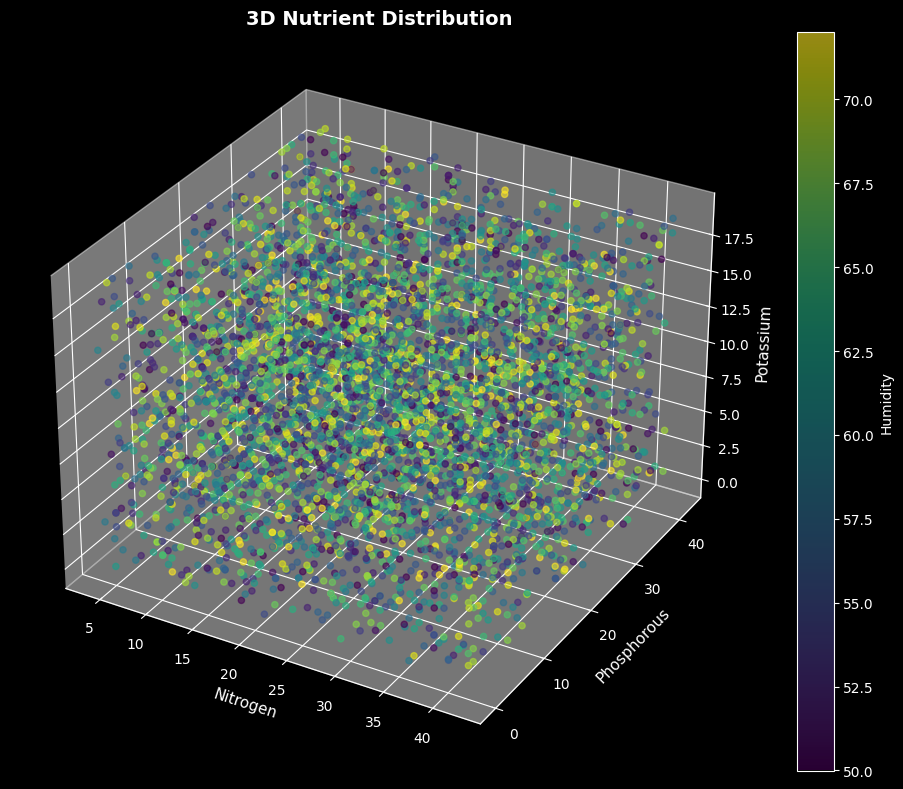

In [84]:
plot_3d_scatter(train, 'Nitrogen', 'Phosphorous', 'Potassium', color_col='Humidity',
               title='3D Nutrient Distribution')

* Lolipop Charts

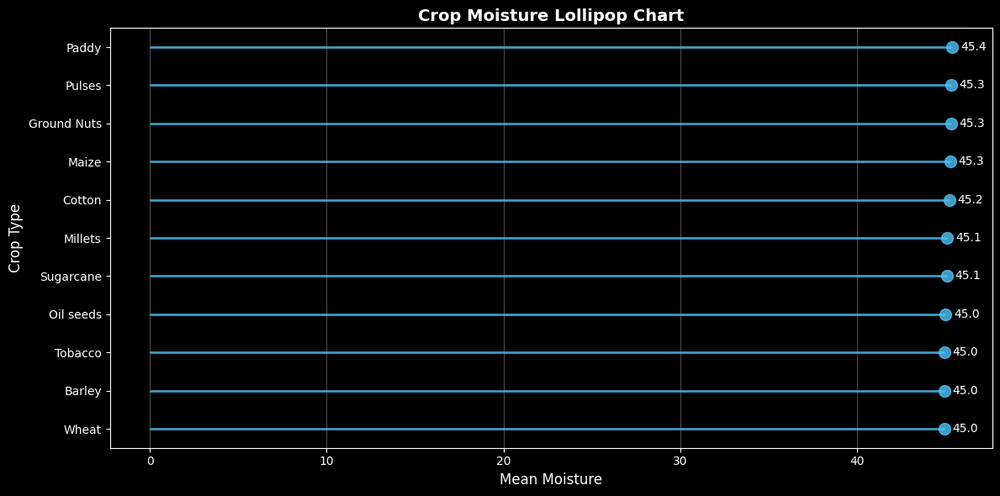

Crop Type
Wheat          44.959571
Barley         44.964096
Tobacco        44.969181
Oil seeds      45.028548
Sugarcane      45.083836
Millets        45.117993
Cotton         45.237514
Maize          45.303931
Ground Nuts    45.315547
Pulses         45.333861
Paddy          45.400350
Name: Moisture, dtype: float64

In [79]:
plot_lollipop(train, 'Crop Type', 'Moisture', title='Crop Moisture Lollipop Chart')

* Y-variable Distribution

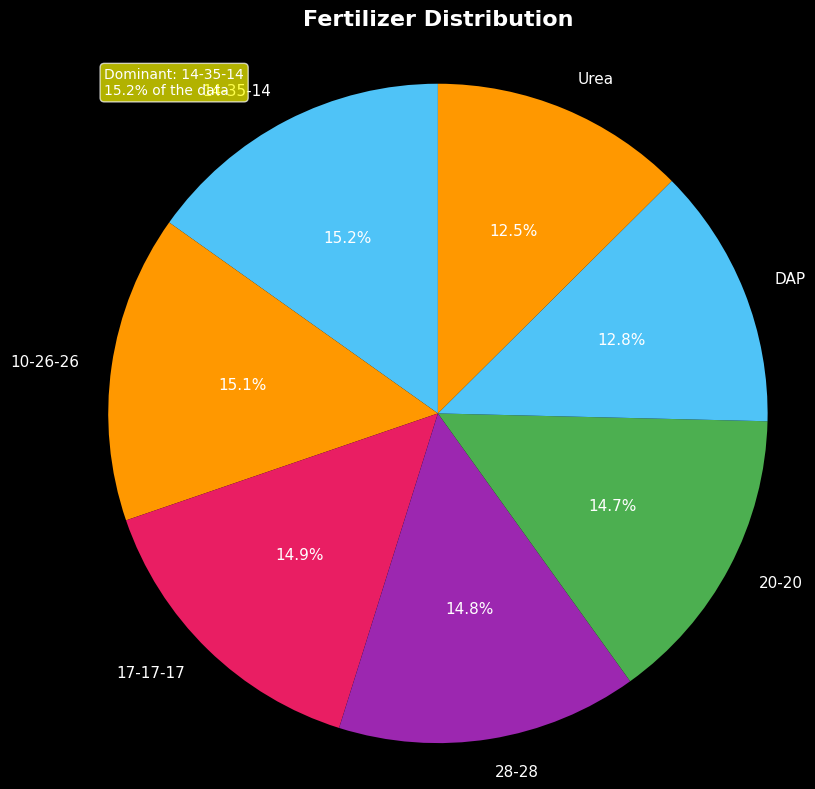

Fertilizer Name
14-35-14    128928
10-26-26    128265
17-17-17    126625
28-28       125390
20-20       125070
DAP         109080
Urea        106642
Name: count, dtype: int64

In [80]:
plot_distribution_pie(train, 'Fertilizer Name', title='Fertilizer Distribution')

* Bubble Charts

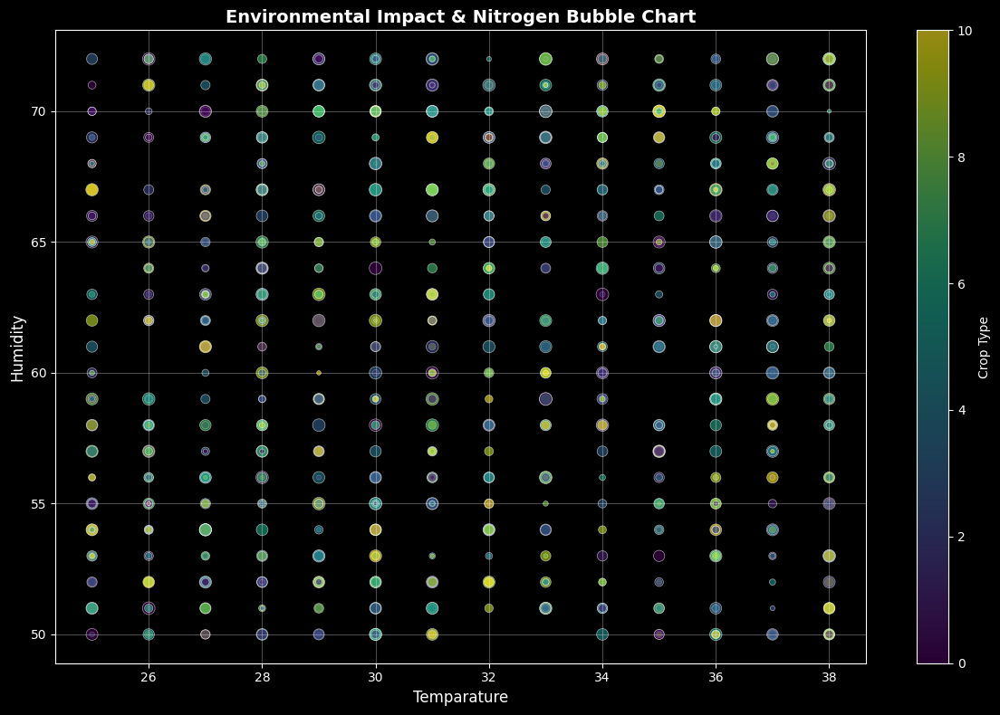

In [83]:
plot_bubble_chart(train, 'Temparature', 'Humidity', 'Nitrogen', color_col='Crop Type',
                 title='Environmental Impact & Nitrogen Bubble Chart')

# That's all for the EDA! Onto the predictions next!